In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from wrangle import wrangle_da

In [2]:
df = wrangle_da()

In [3]:
df

,court_number,arrest_date,arresting_agency,crime_type,booked_case_type,dv_case,da_action_taken,year,month,weekend
0,11002204,2011-01-21,SFPD,Willful Homicide,Felony,No,Discharged,2011,1,0
1,11008968,2011-03-31,SFPD,Willful Homicide,Felony,No,Discharged,2011,3,0
2,11008679,2011-03-28,SFPD,Willful Homicide,Felony,No,Discharged,2011,3,0
3,2460003,2011-05-25,SFPD,Willful Homicide,Felony,No,Discharged,2011,5,0
4,11018969,2011-07-15,SFPD,Willful Homicide,Felony,No,Discharged,2011,7,0
...,...,...,...,...,...,...,...,...,...,...
135448,22009862,2022-08-31,SFPD,NA (Att.),Felony,No,Charges Filed,2022,8,0
135449,13019620,2013-07-15,SFPD,NA (Att.),Felony,No,Charges Filed,2013,7,0
135450,14015903,2014-06-15,SFPD,NA (Att.),Felony,No,Charges Filed,2014,6,1
135451,20006299,2020-05-30,SFPD,NA (Att.),Felony,No,Charges Filed,2020,5,1


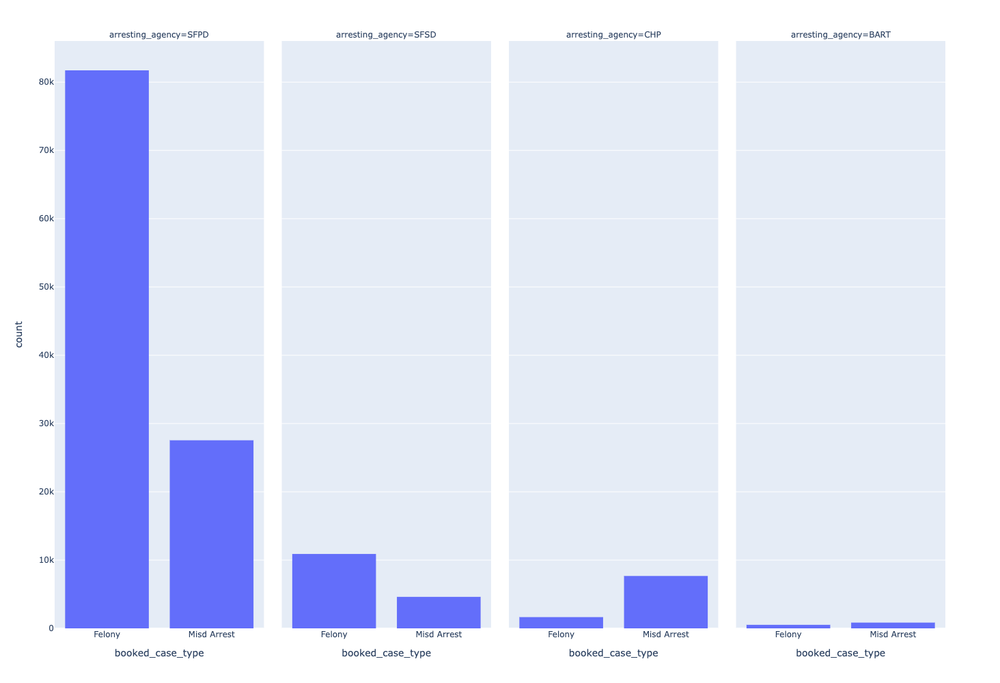

In [4]:
px.histogram(data_frame=df, 
             x= 'booked_case_type',
             facet_col= 'arresting_agency',
             facet_col_wrap=5,
             # facet_col_spacing=.1,
             height=1000,
             # barnorm='fraction'
             # log_y=True
            )

In [5]:
from formating import percent

In [6]:
for i in df.arresting_agency.unique():
    case_type_counts = df.booked_case_type[df.arresting_agency == i].value_counts(sort=False)
    tot_case = case_type_counts[0] + case_type_counts[1]
    fel_per = case_type_counts[0] / tot_case
    misd_per = case_type_counts[1] / tot_case
    print(f"{i}:\n\n {case_type_counts}\n\nFelony Percentage: {percent(fel_per)}\
\nMisdemeanor Percenrage: {percent(misd_per)}\n\n\n")

SFPD:

 Felony         81721
Misd Arrest    27544
Name: booked_case_type, dtype: int64

Felony Percentage: 74.79%
Misdemeanor Percenrage: 25.21%



SFSD:

 Felony         10897
Misd Arrest     4614
Name: booked_case_type, dtype: int64

Felony Percentage: 70.25%
Misdemeanor Percenrage: 29.75%



CHP:

 Felony         1646
Misd Arrest    7672
Name: booked_case_type, dtype: int64

Felony Percentage: 17.66%
Misdemeanor Percenrage: 82.34%



BART:

 Felony         517
Misd Arrest    842
Name: booked_case_type, dtype: int64

Felony Percentage: 38.04%
Misdemeanor Percenrage: 61.96%





In [7]:
df.arresting_agency.value_counts()

SFPD    109265
SFSD     15511
CHP       9318
BART      1359
Name: arresting_agency, dtype: int64

## Felony/Misdemeanor Arrest Rates by Agency

|Agency|Total Arrests|Felony | Misdemeanor |
|---|---|---|---|
|SF Police D.| 109k| 75%| 25%|
|SF Sherrif Dept| 15.5k|70%| 30%|
|Cali. Highway Patrol| 9k |18% | 82%|
|Bay Area Rapid Trainsit| 1k | 38%| 62%|
<br><br>
- **It looks like the reported data shows The Police and Sherriff's Departments mostly deal with Felony Arrests**
- **While the Highway Patrol is almost entirely Misdemeanors**
- **And the Bay Area Rapid Transit has the closest to even percentages of Felony and Misdemeanor**
  - **With the exception that they only have 1359 total arrests in over 10 years**

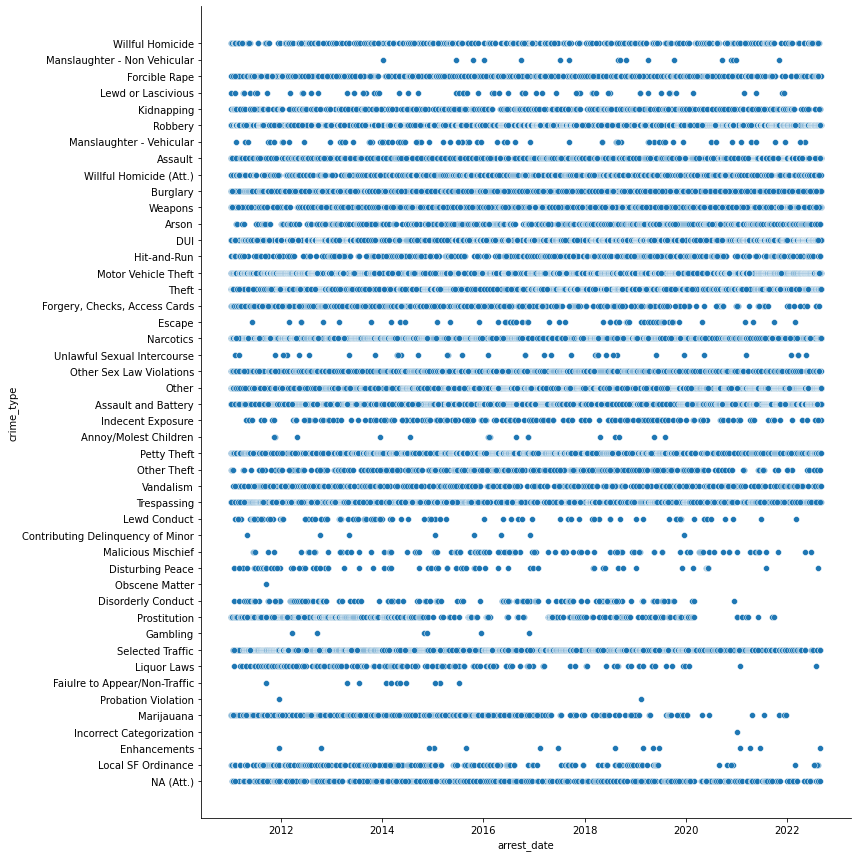

In [8]:
sns.relplot(data=df,
            x= 'arrest_date',
            y= 'crime_type',
            height= 12
           )

plt.show()


### Observations

- **Failure to Appear/Non-Traffic seems to drop off completely by 2016**
- **There only seems to be 1 'Incorrect Categorization'**
  - **probably drop that**
  
- **

In [9]:
df.crime_type.value_counts()

Assault                              25797
Narcotics                            18981
Other                                14000
Burglary                             13300
DUI                                  11824
Assault and Battery                  11152
Theft                                 7375
Robbery                               6892
Weapons                               5559
Motor Vehicle Theft                   5360
Petty Theft                           2041
Trespassing                           1740
Selected Traffic                      1414
Marijauana                            1403
Other Sex Law Violations              1021
Prostitution                           796
Willful Homicide (Att.)                733
Forgery, Checks, Access Cards          624
Forcible Rape                          615
Arson                                  592
Kidnapping                             560
NA (Att.)                              488
Willful Homicide                       456
Hit-and-Run

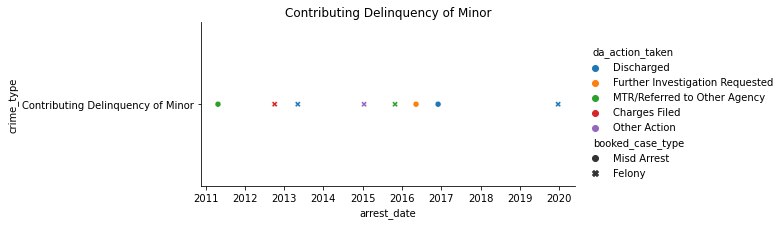

In [10]:
crime = 'Contributing Delinquency of Minor'

sns.relplot(data=df[df.crime_type == crime],
            x= 'arrest_date',
            y= 'crime_type',
            style= 'booked_case_type',
            hue= 'da_action_taken',
            height= 3,
            aspect= 3
           )
plt.title(f'{crime}')

plt.show()


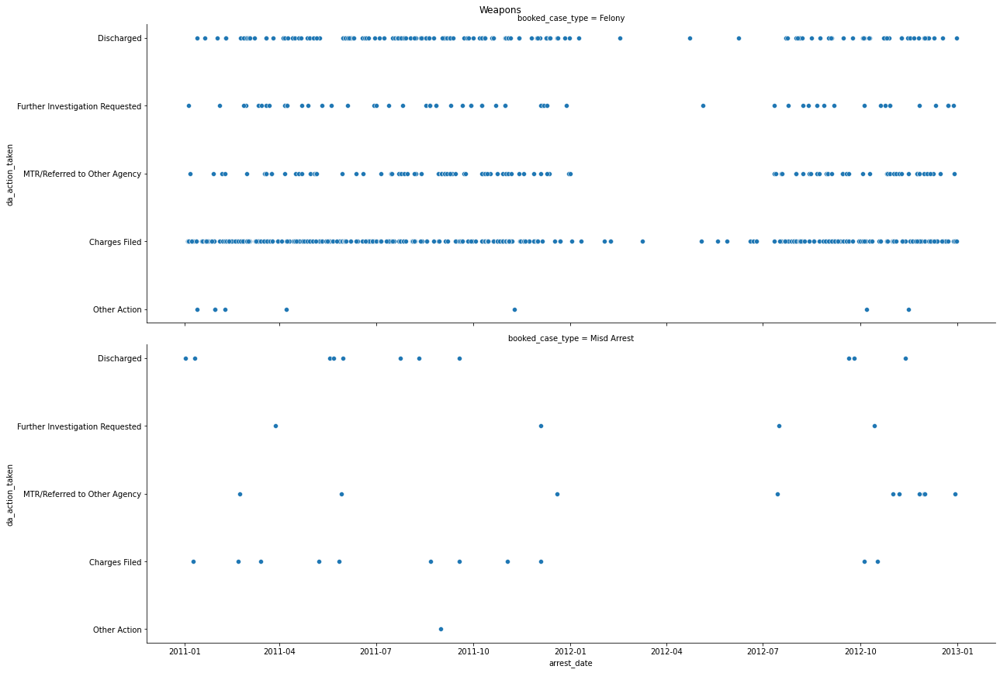

In [11]:
crime = 'Weapons'
date_range = ['2011' , '2013']

sns.relplot(data=df[(df.crime_type == crime) & (df.arrest_date > date_range[0]) & (df.arrest_date < date_range[1])],
            x= 'arrest_date',
            y= 'da_action_taken',
            row= 'booked_case_type',
            # row= 'da_action_taken',
            height= 6,
            aspect= 3
           )
plt.suptitle(f'{crime}', y=1)

plt.show()


- **There seemed to be a drop in Weapon arrests during the first half of 2012... I wonder why**

In [12]:
# df.da_action_taken = df.da_action_taken.astype('category')

# df.da_action_taken = df.da_action_taken.cat.set_categories(['Discharged', 'Further Investigation Requested',
#        'MTR/Referred to Other Agency', 'Charges Filed', 'Other Action'])

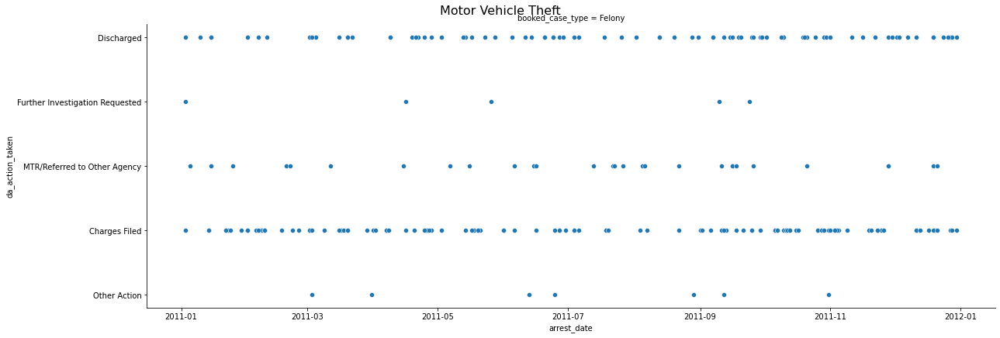

In [13]:
crime = 'Motor Vehicle Theft'
# date_range = ['2011' , '2013']
year = 2011

sns.relplot(data=df[(df.crime_type == crime) & (df.year == year)],# & (df.arrest_date > date_range[0]) & (df.arrest_date < date_range[1])],
            x= 'arrest_date',
            y= 'da_action_taken',
            # col= 'year',
            # col_wrap=1,
            row= 'booked_case_type',
            # row= 'da_action_taken',
            height= 6,
            aspect= 3
           )
plt.suptitle(f'{crime}', y=1, fontsize=16)

plt.show()


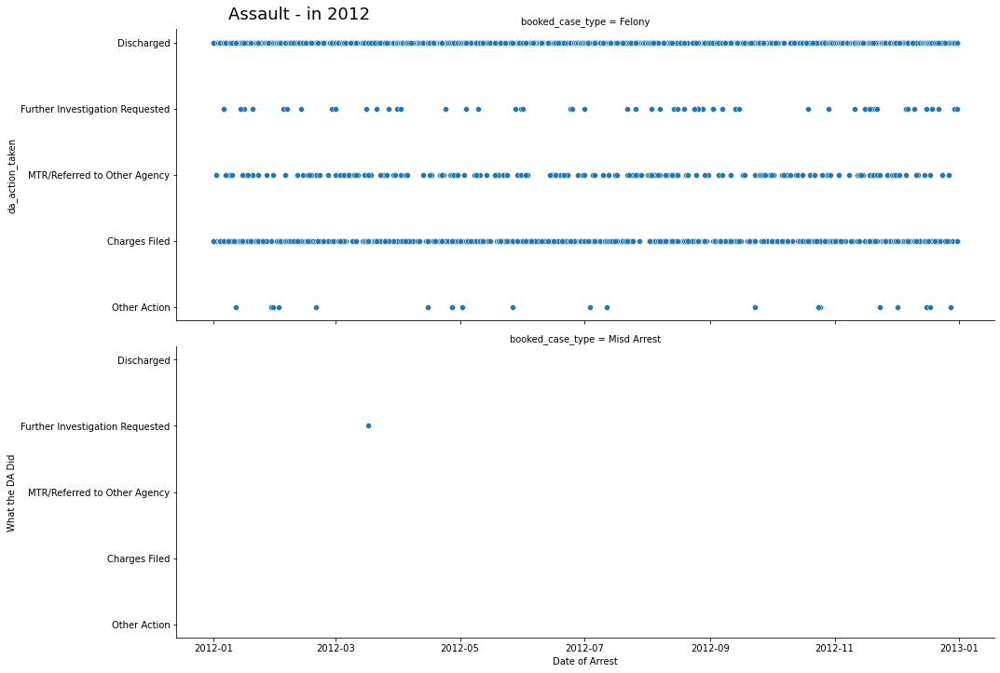

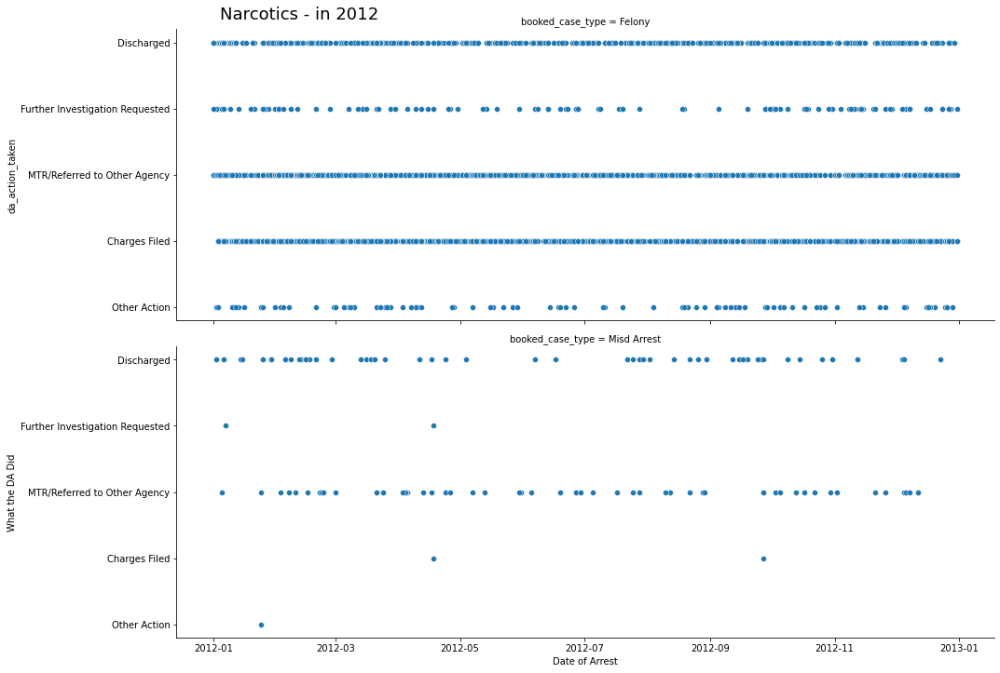

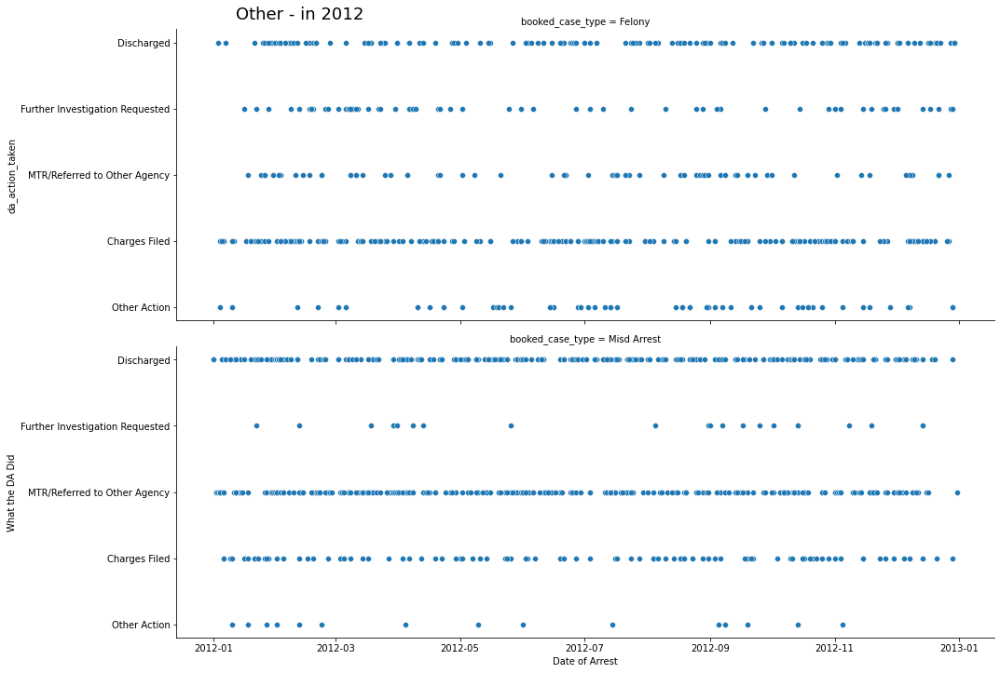

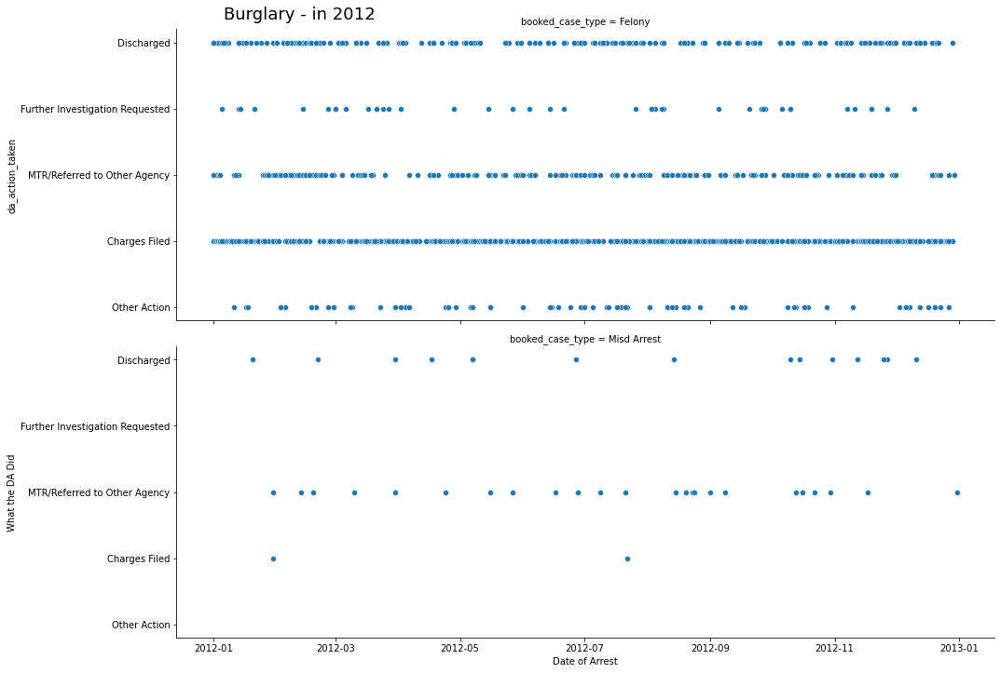

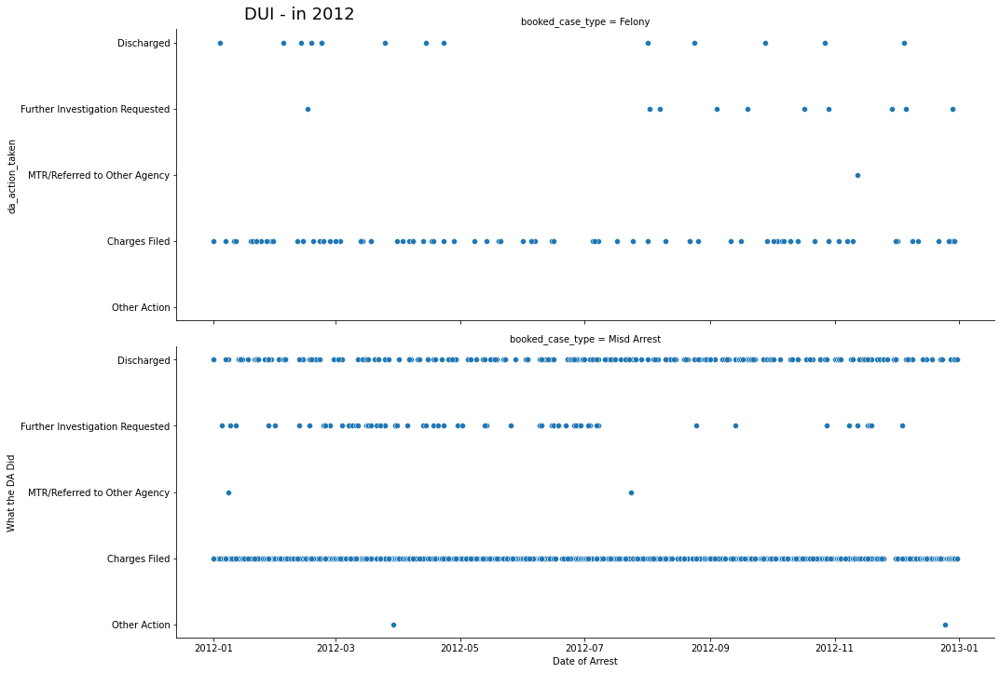

...

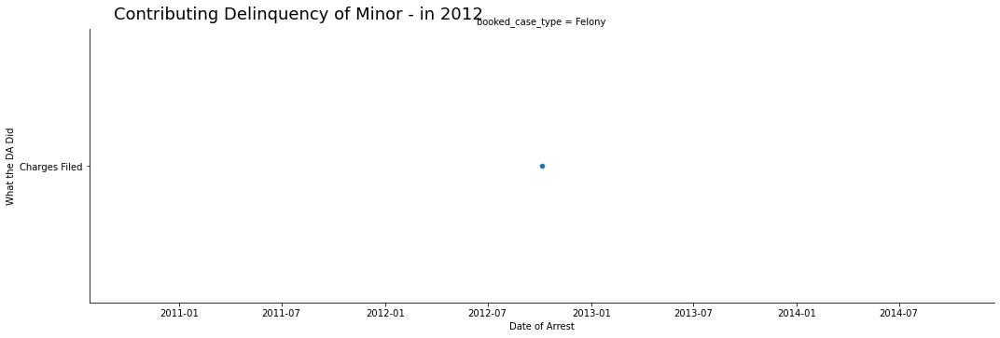

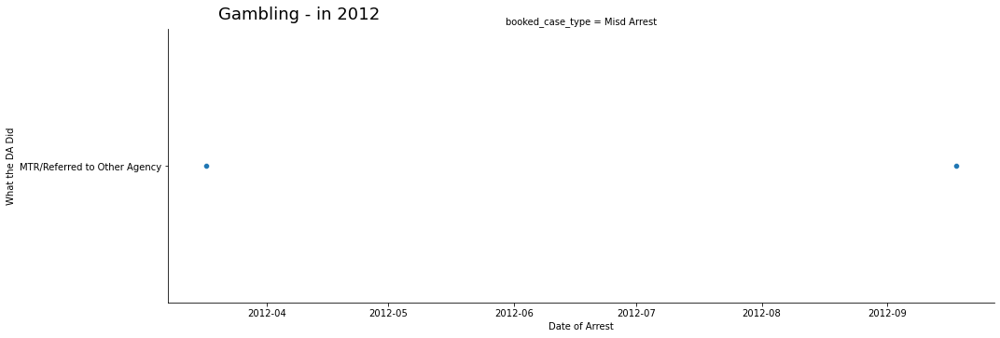

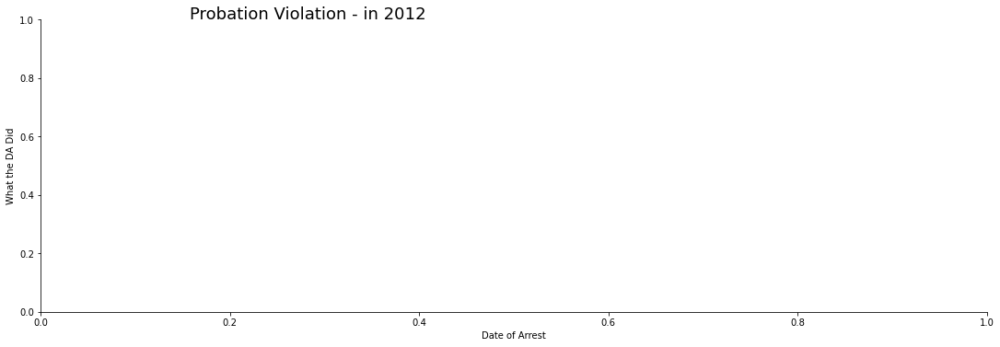

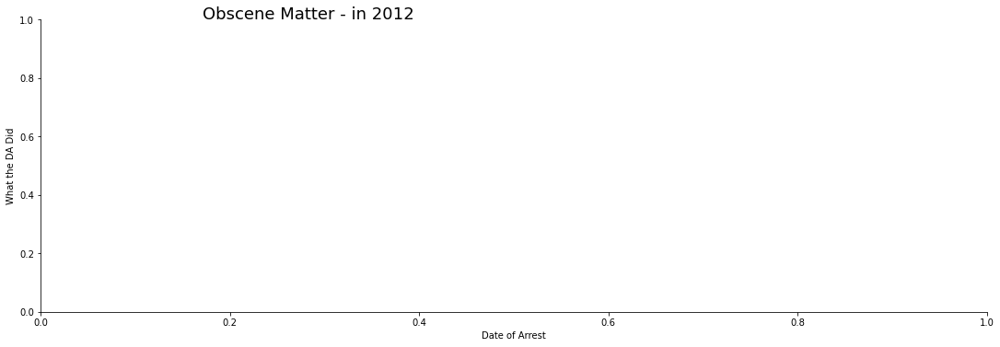

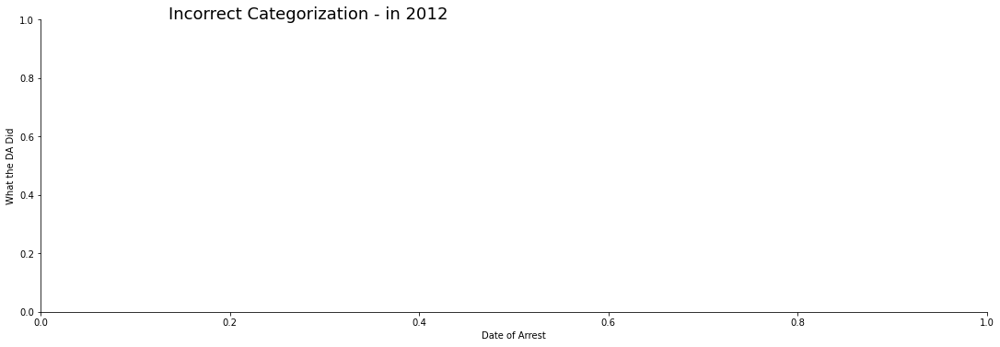

In [46]:
for i in df.crime_type.value_counts().index:
    crime = i #'Motor Vehicle Theft'
    # date_range = ['2011' , '2013']
    year = 2012

    sns.relplot(data=df[(df.crime_type == crime) & (df.year == year)],# & (df.arrest_date > date_range[0]) & (df.arrest_date < date_range[1])],
                x= 'arrest_date',
                y= 'da_action_taken',
                # col= 'year',
                # col_wrap=1,
                row= 'booked_case_type',
                # row= 'da_action_taken',
                height= 5,
                aspect= 3,
                )
    plt.suptitle(f'{crime} - in {year}', y=1, x=0.3, fontsize=18)
    
    plt.xlabel('Date of Arrest')
    plt.ylabel('What the DA Did')
    
    plt.show()
    
    print('\n\n\n')

In [65]:
crime_type_obs = pd.DataFrame(columns={'crime_type', 'dates', 'observations'})

In [66]:
crime_type_obs

,crime_type,observations,dates


In [67]:
# crime_type_obs.loc[len(crime_type_obs)] = ['being bad', 'Crazy stuff', ['2011', '2022']]
# crime_type_obs

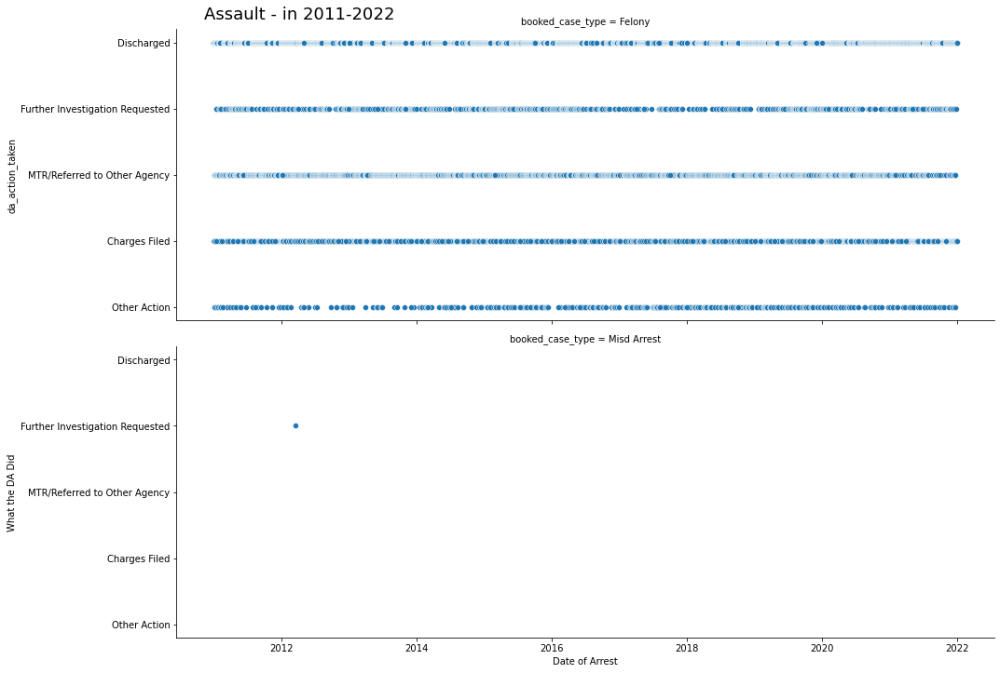

Observations...?  :  There was only 1 Misdemeanor Assault case, and it needed further investigation. The Least represented action was Other Action




 There was only 1 Misdemeanor Assault case, and it needed further investigation. The Least represented action was Other Action 





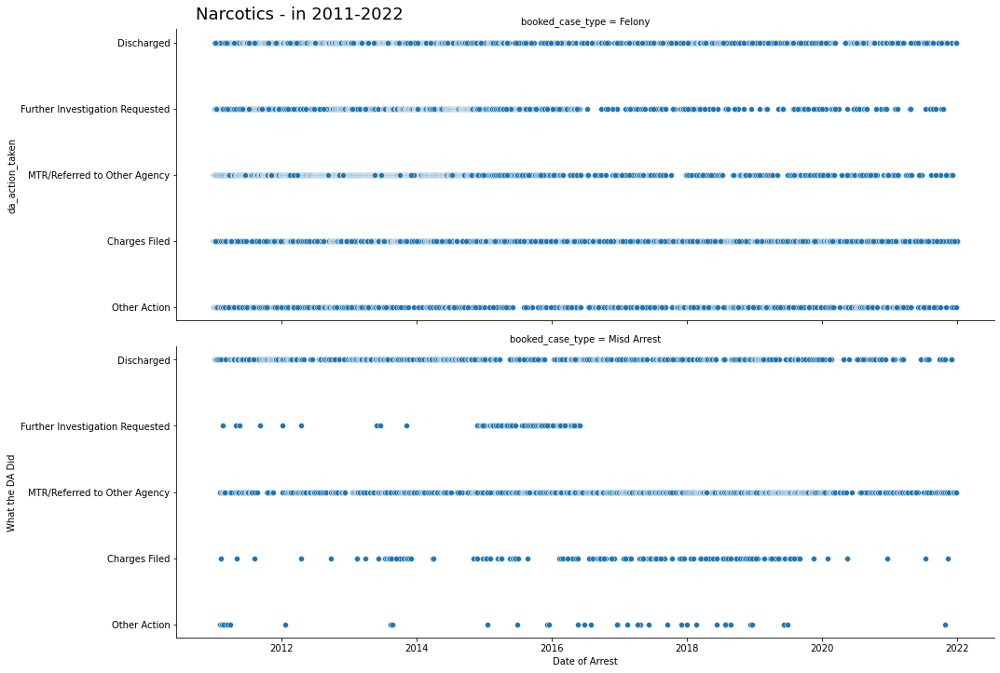

Observations...?  :  DA stopped requesting further investigation on Misdemeanor Narc Arrests mid 2016 after about a year of doing it a lot. And since late 2019 filed almost no charges on Misd. 




 DA stopped requesting further investigation on Misdemeanor Narc Arrests mid 2016 after about a year of doing it a lot. And since late 2019 filed almost no charges on Misd.  





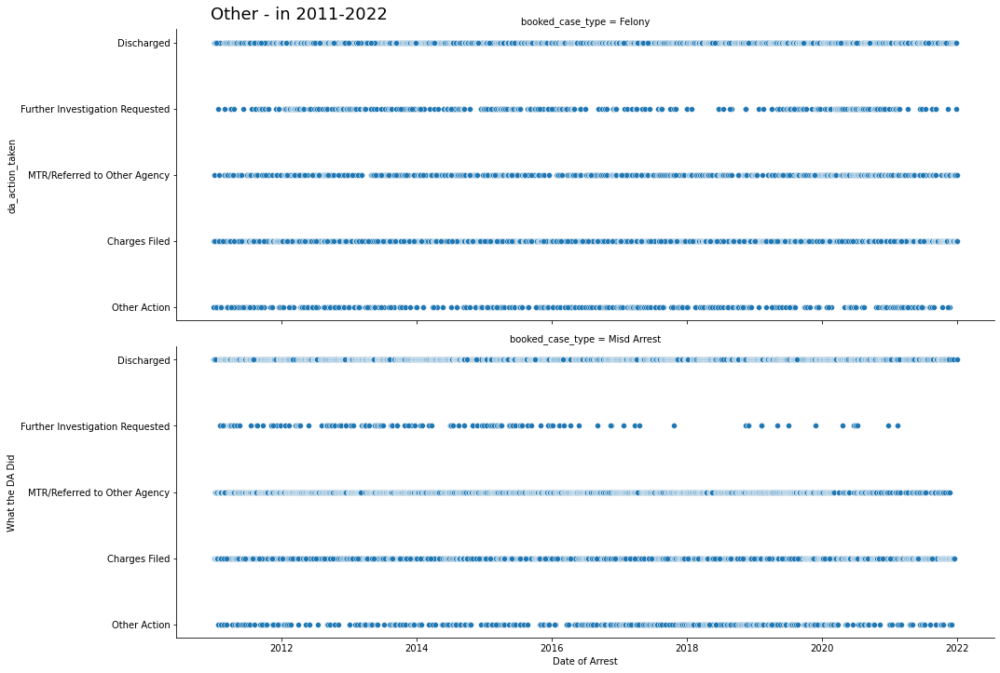

Observations...?  :  Other is a mixed basket of what?? I think we might drop this soon.




 Other is a mixed basket of what?? I think we might drop this soon. 





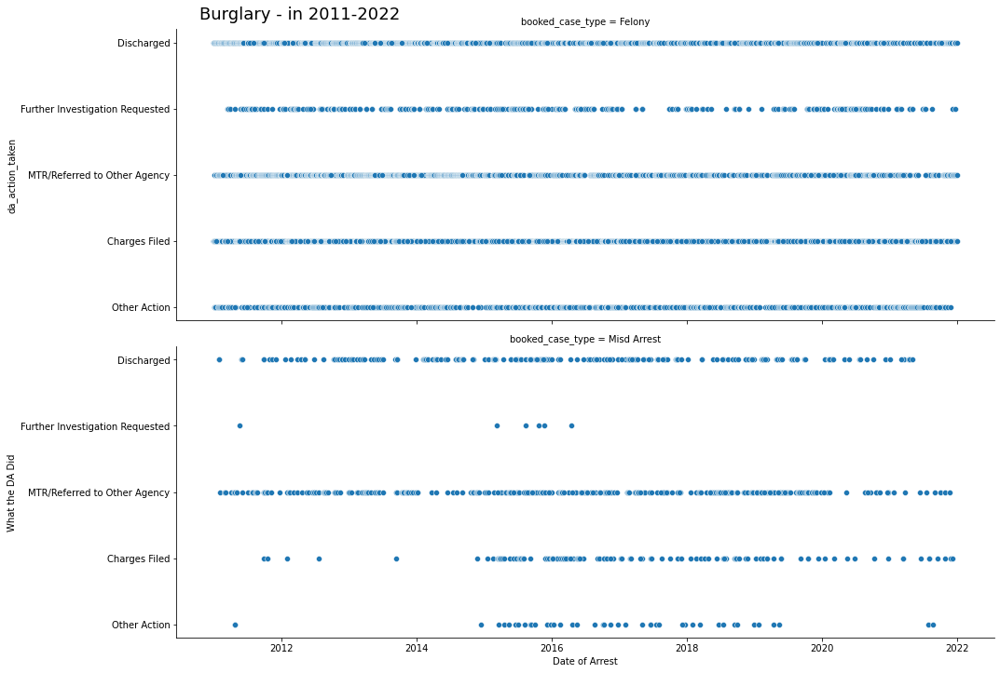

Observations...?  :  Burglary looks like it's discharged more often than the DA does any other action




 Burglary looks like it's discharged more often than the DA does any other action 





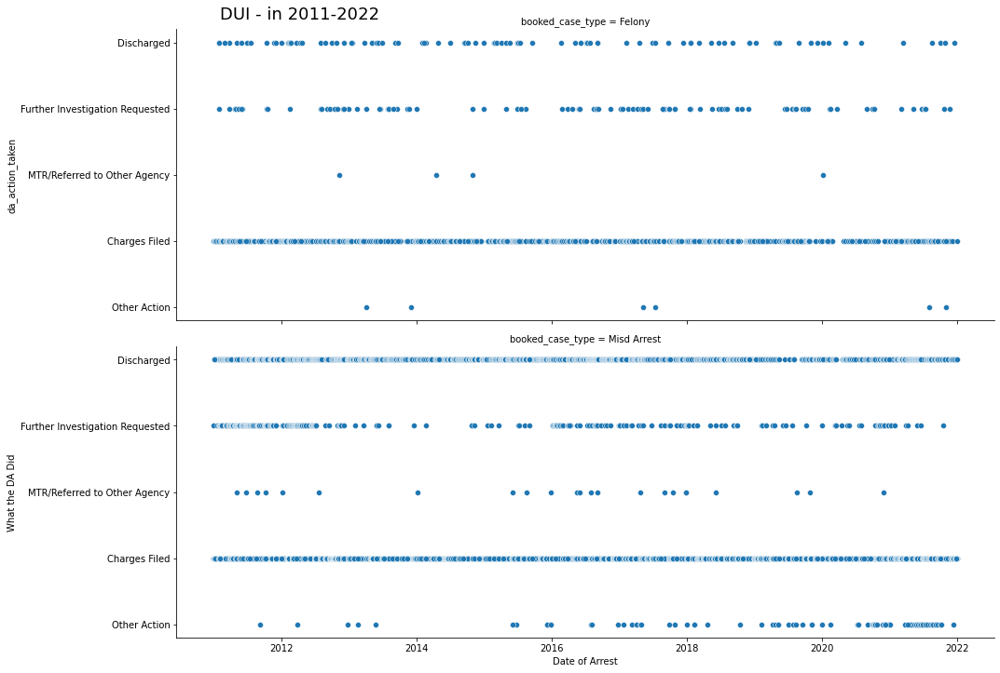

Observations...?  :  Most of the time Misd DUIs are discharged with Charges being filed a good bit as well. While almost all Felony DUIs have charges filed




 Most of the time Misd DUIs are discharged with Charges being filed a good bit as well. While almost all Felony DUIs have charges filed 





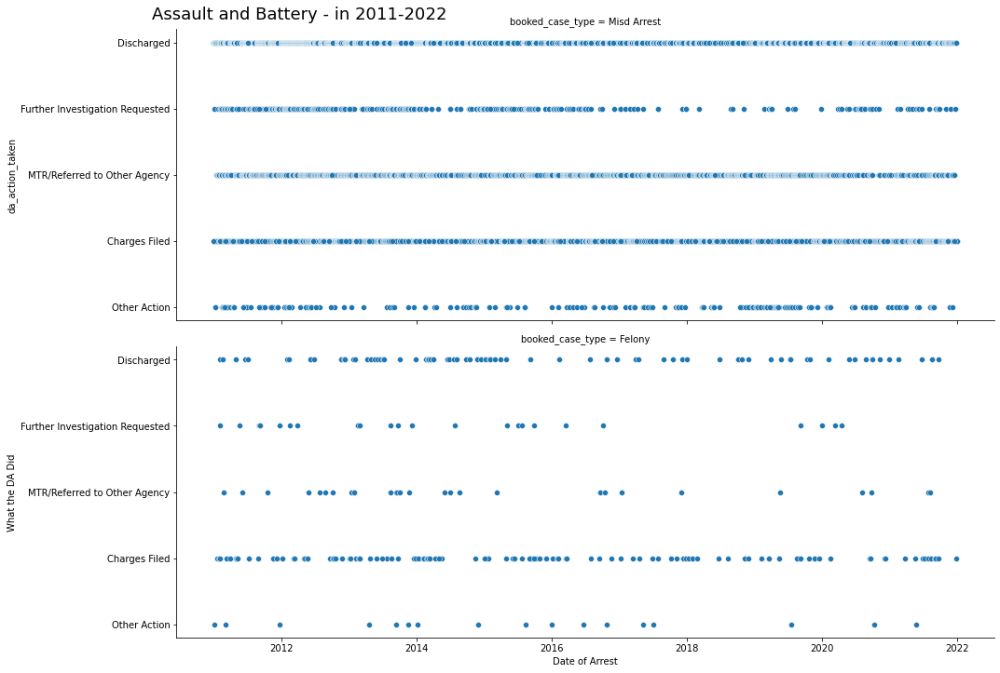

Observations...?  :  most Ass&Bat charges are Felony with most being discharged or referred away and a big gap in Further investigation from mid 2017-2020




 most Ass&Bat charges are Felony with most being discharged or referred away and a big gap in Further investigation from mid 2017-2020 





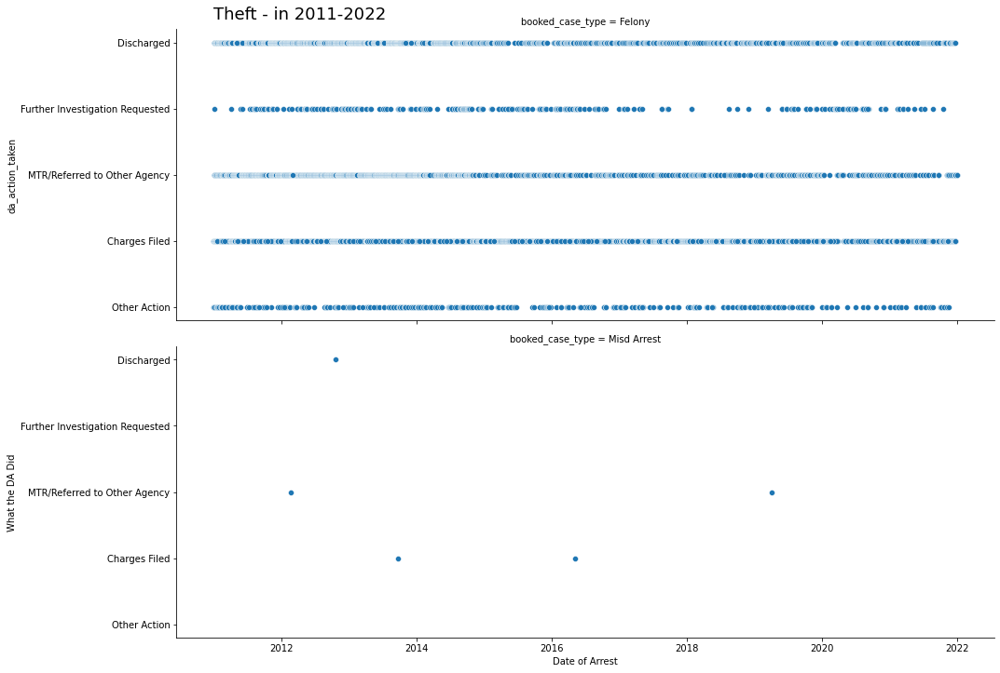

Observations...?  :  All but 5 Theft cases are Felony with a similar trend of mostly discharged or referred away, and again we see the drop in asking for further investigation since mid 2017




 All but 5 Theft cases are Felony with a similar trend of mostly discharged or referred away, and again we see the drop in asking for further investigation since mid 2017 





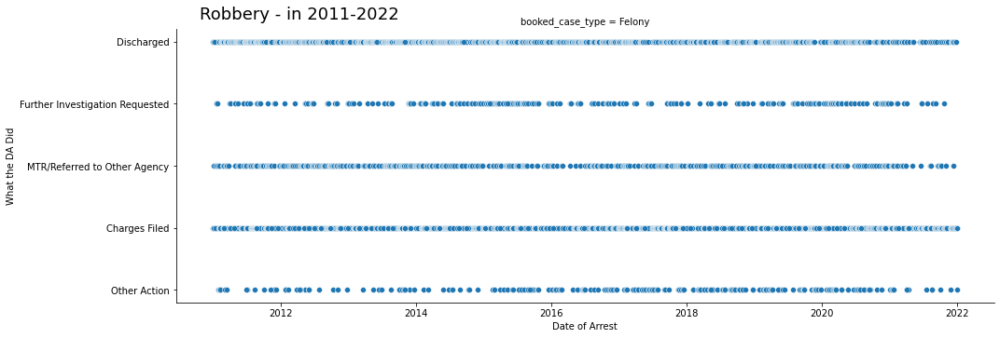

Observations...?  :  ALL Robbery is Felony in SF and most get discharged




 ALL Robbery is Felony in SF and most get discharged 





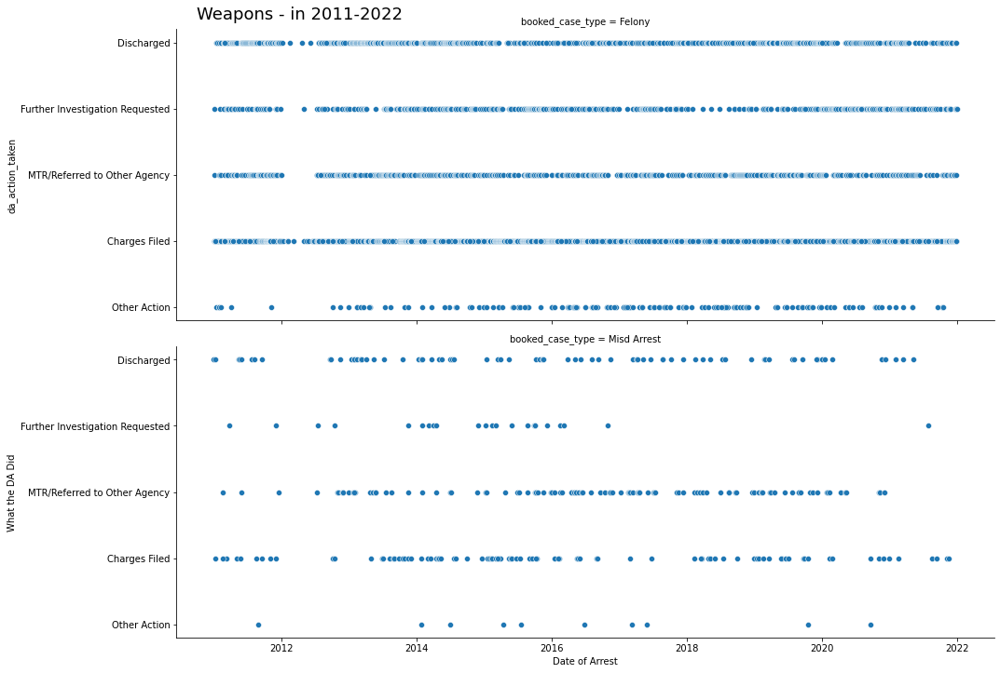

Observations...?  :  Weapons charges are mostly Felony with a BIG drop in arrests of all kinds in the first half of 2012




 Weapons charges are mostly Felony with a BIG drop in arrests of all kinds in the first half of 2012 





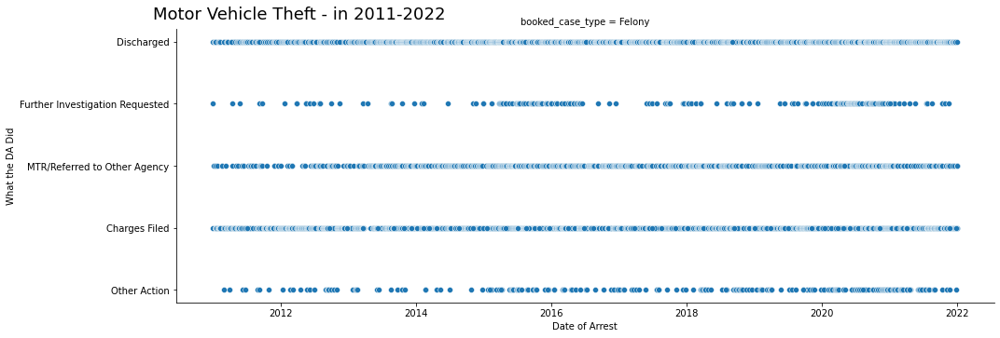

Observations...?  :  Stealing cars is always a Felony. And is most often Discharged or Referred away




 Stealing cars is always a Felony. And is most often Discharged or Referred away 





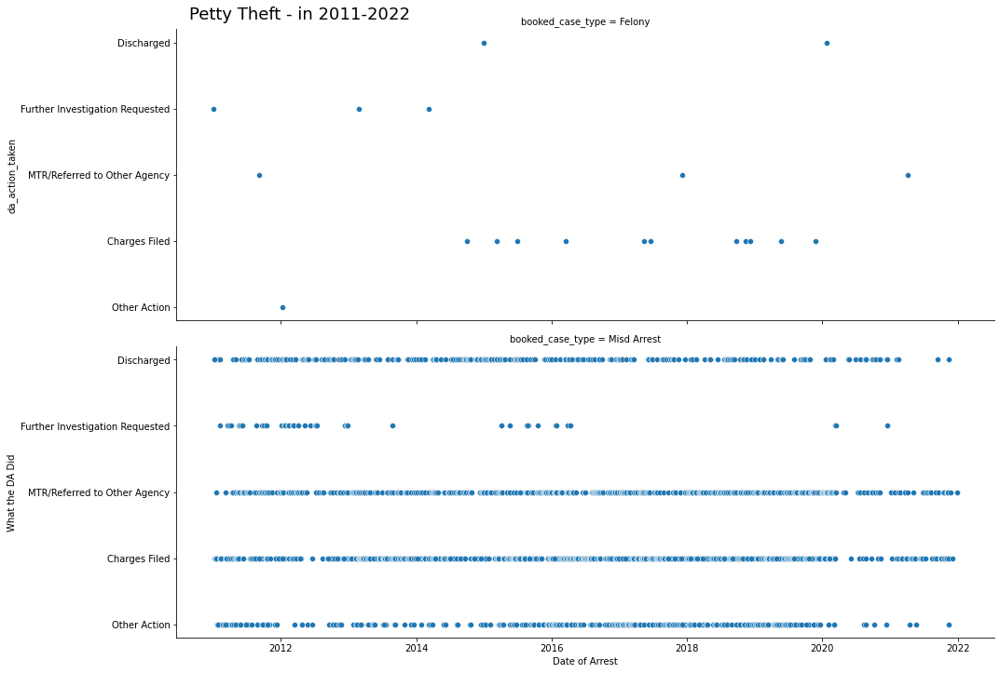

Observations...?  :  If Petty theft is a felony (which it almost never is) they almost always file Charges. Also petty theft almost never needs Further Investigation




 If Petty theft is a felony (which it almost never is) they almost always file Charges. Also petty theft almost never needs Further Investigation 





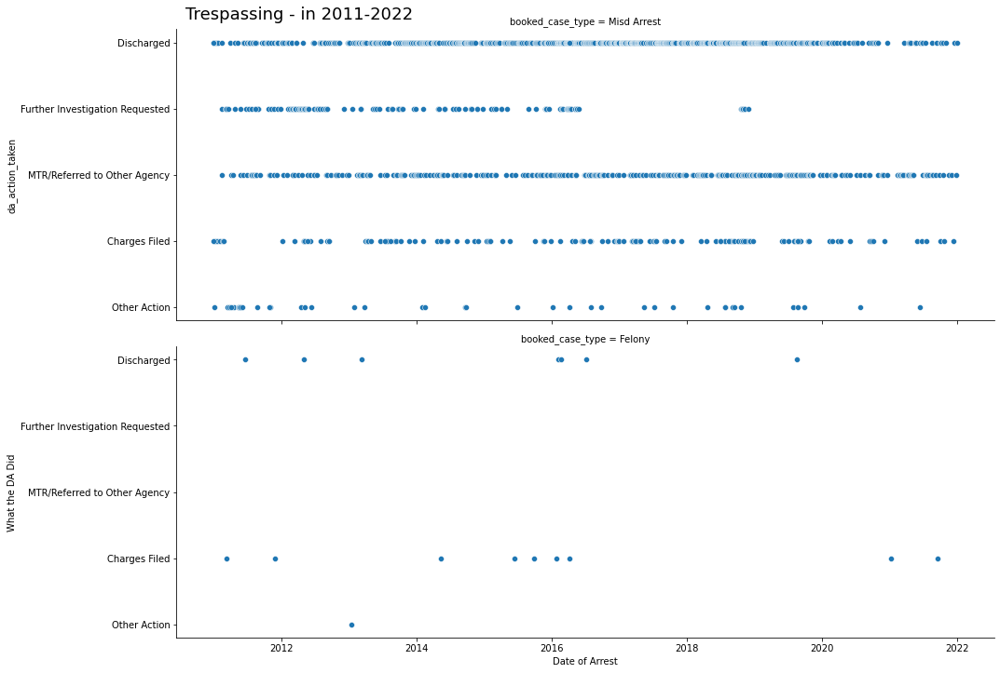

Observations...?  :  Trespassing is almost alway a Misd. and since 2017 almost never needs further investigation. Charges are rarely filed and almost always discharged or referred away.




 Trespassing is almost alway a Misd. and since 2017 almost never needs further investigation. Charges are rarely filed and almost always discharged or referred away. 





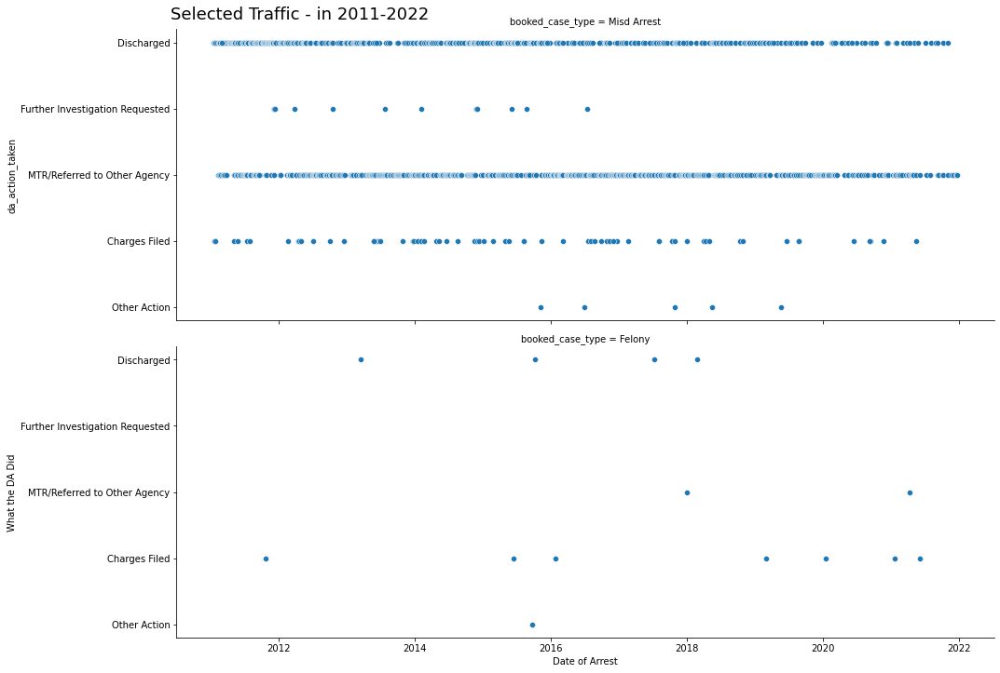

Observations...?  :  Traffic is almost always Misd. and almost always Discharged or Referred away. Also, No Further investigation since 2017




 Traffic is almost always Misd. and almost always Discharged or Referred away. Also, No Further investigation since 2017 





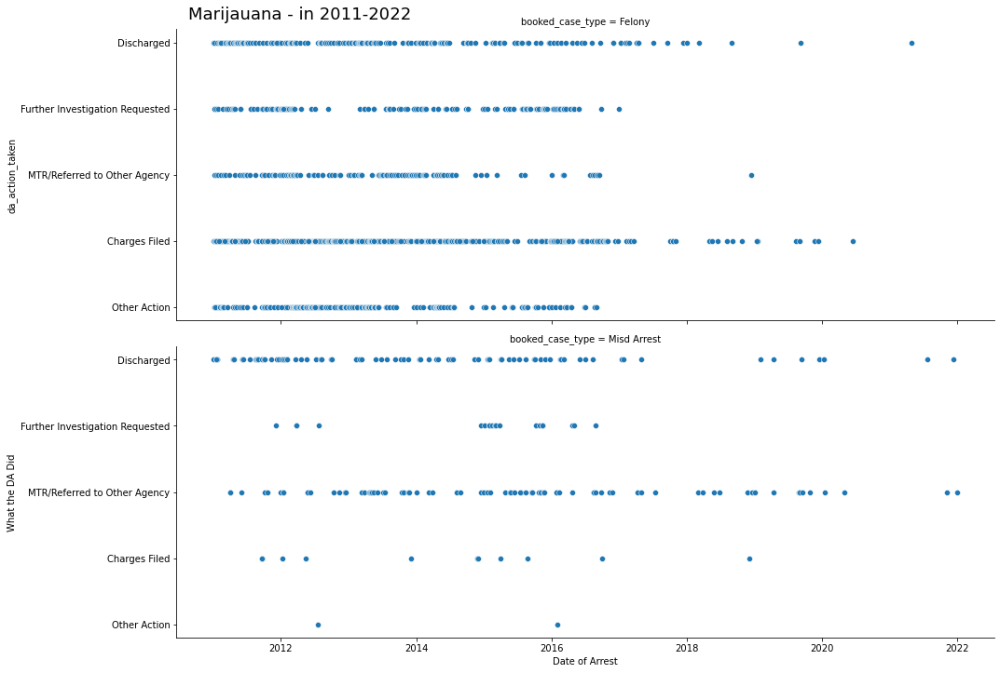

Observations...?  :  MJ arrests dropped sharply in mid 2017 never needed further investigation since 2017 and no charges have been filed since 2020... except that one guy!




 MJ arrests dropped sharply in mid 2017 never needed further investigation since 2017 and no charges have been filed since 2020... except that one guy! 





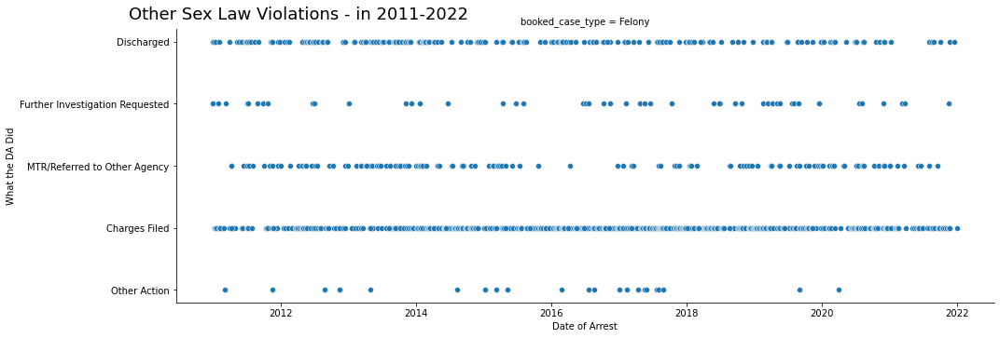

Observations...?  :  


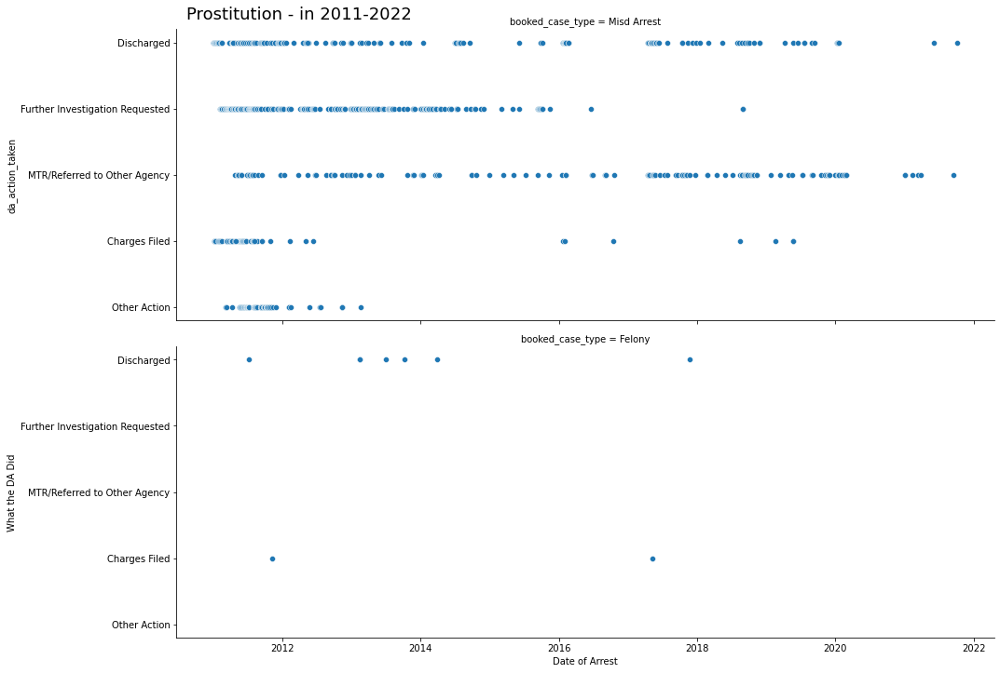

Observations...?  :  


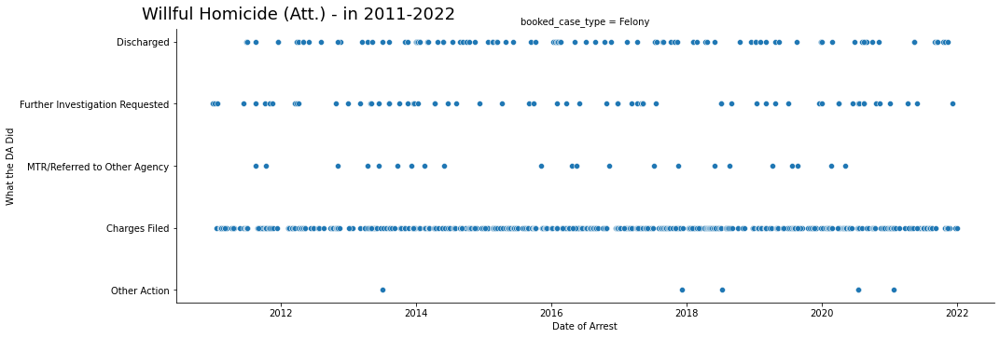

Observations...?  :  


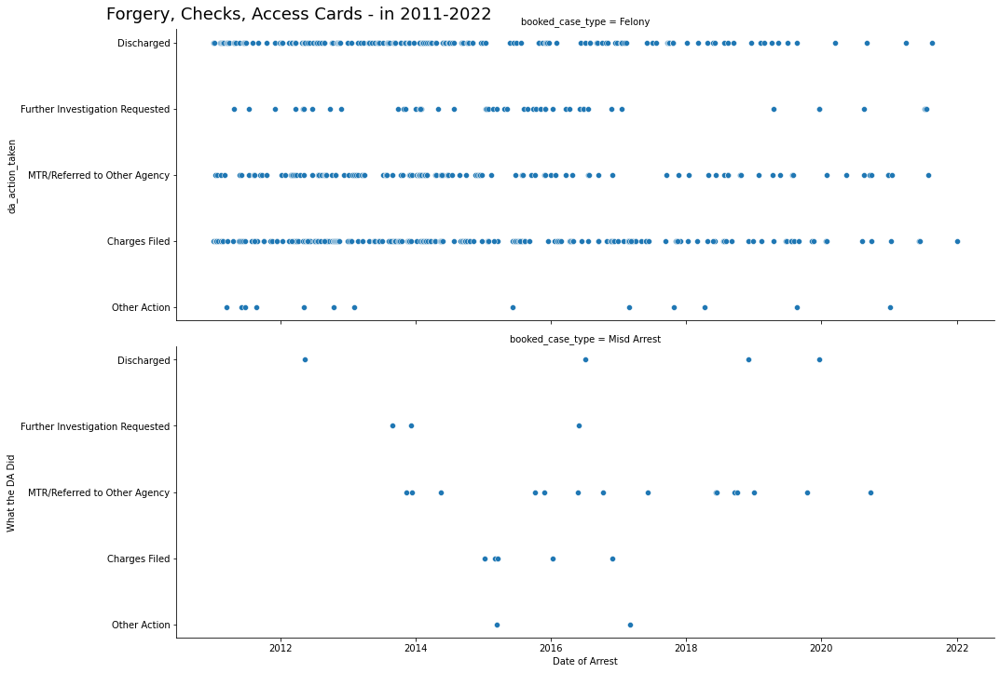

Observations...?  :  


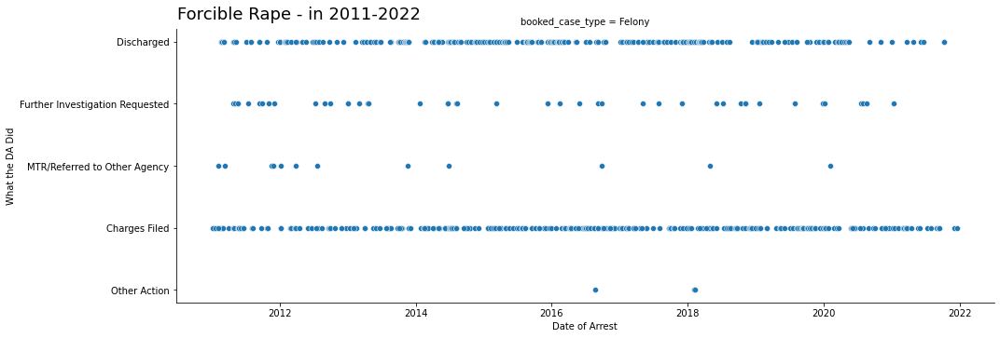

Observations...?  :  


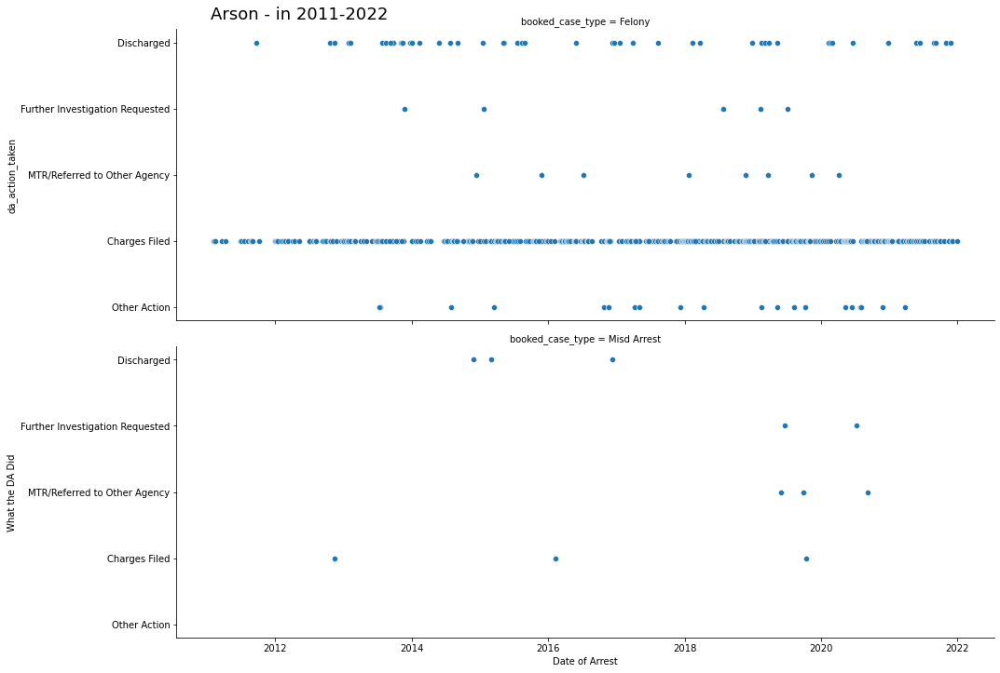

Observations...?  :  


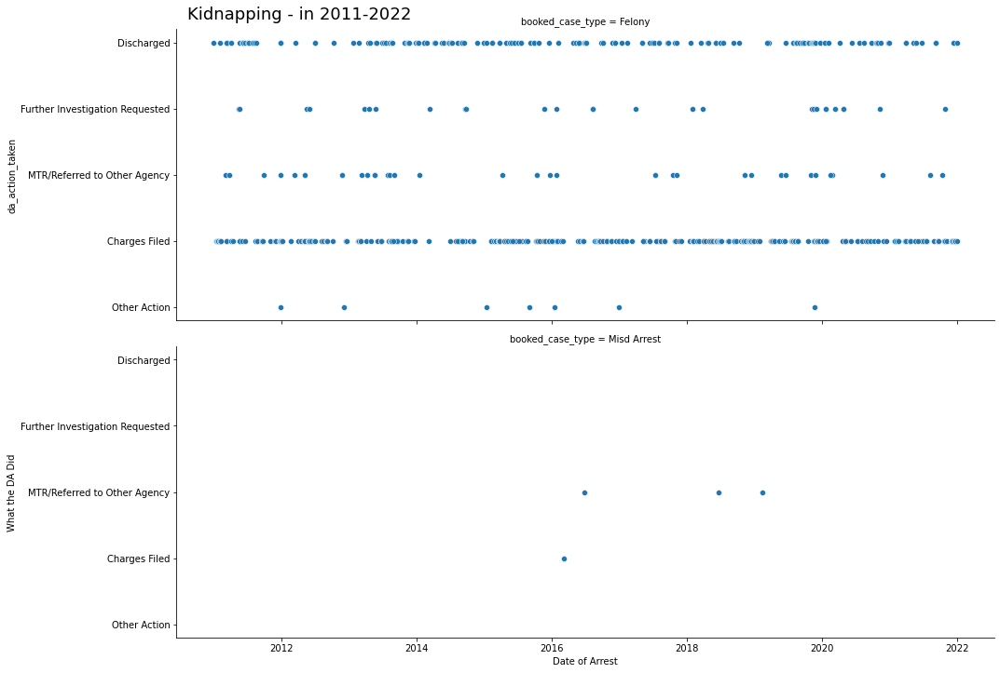

Observations...?  :  


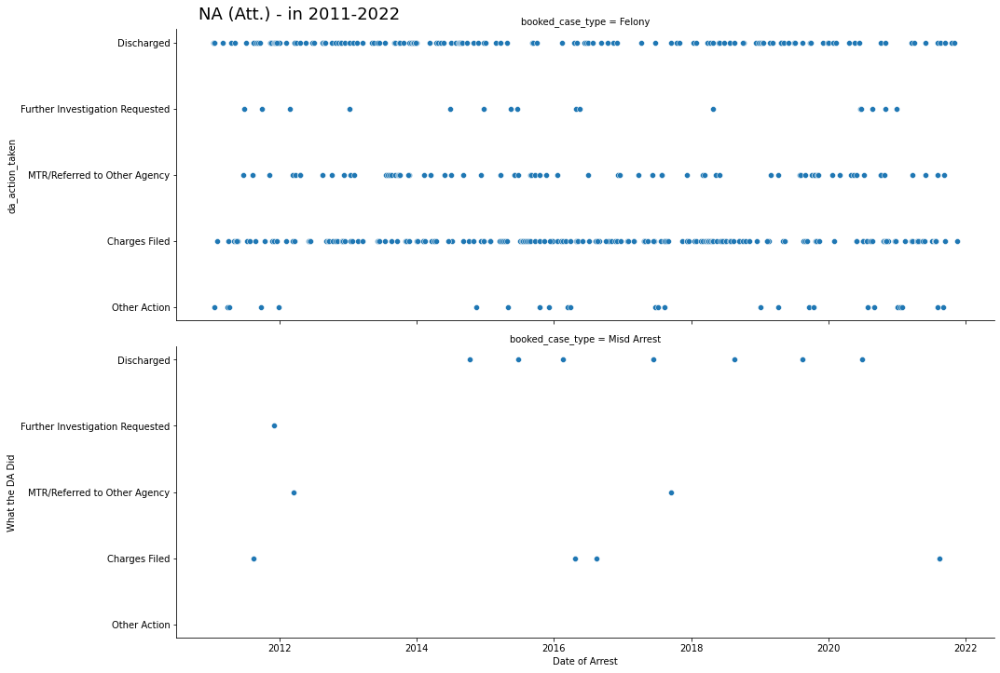

Observations...?  :  


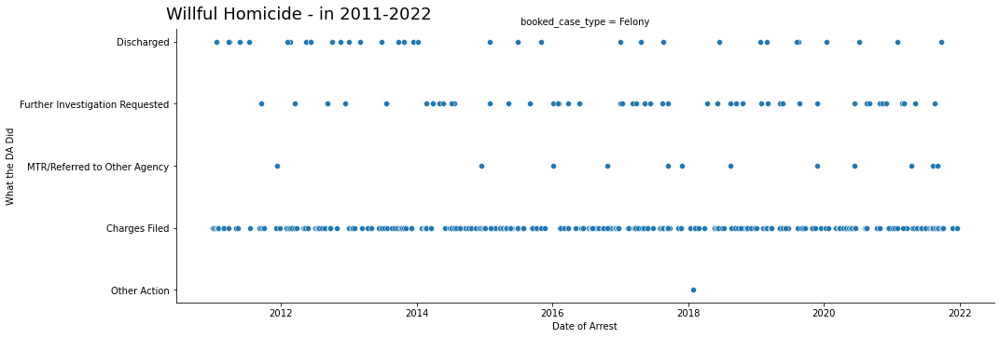

Observations...?  :  


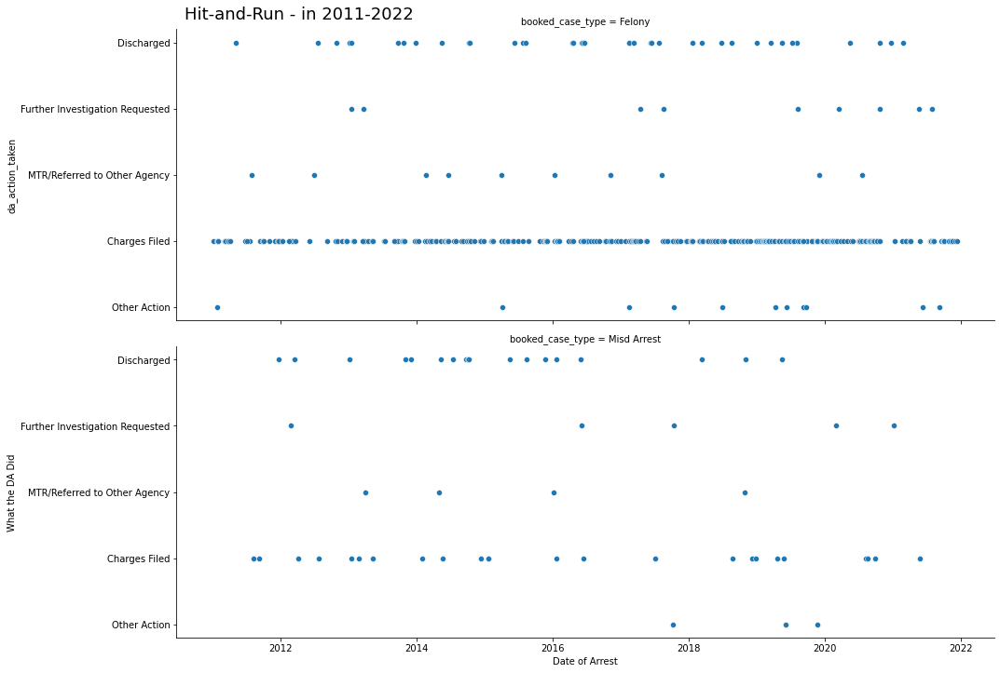

Observations...?  :  


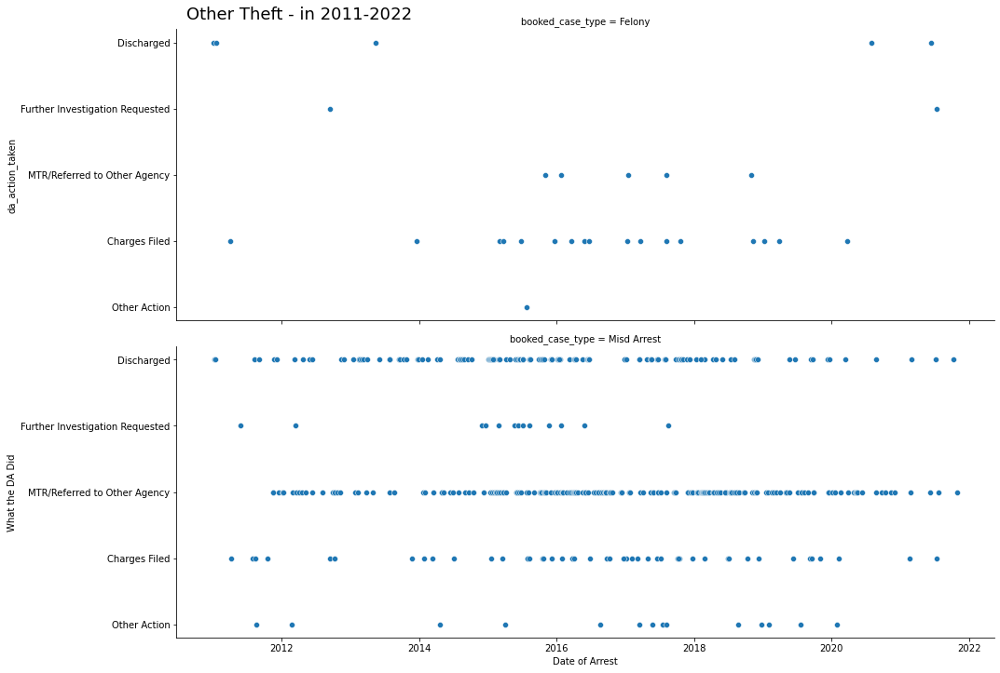

Observations...?  :  


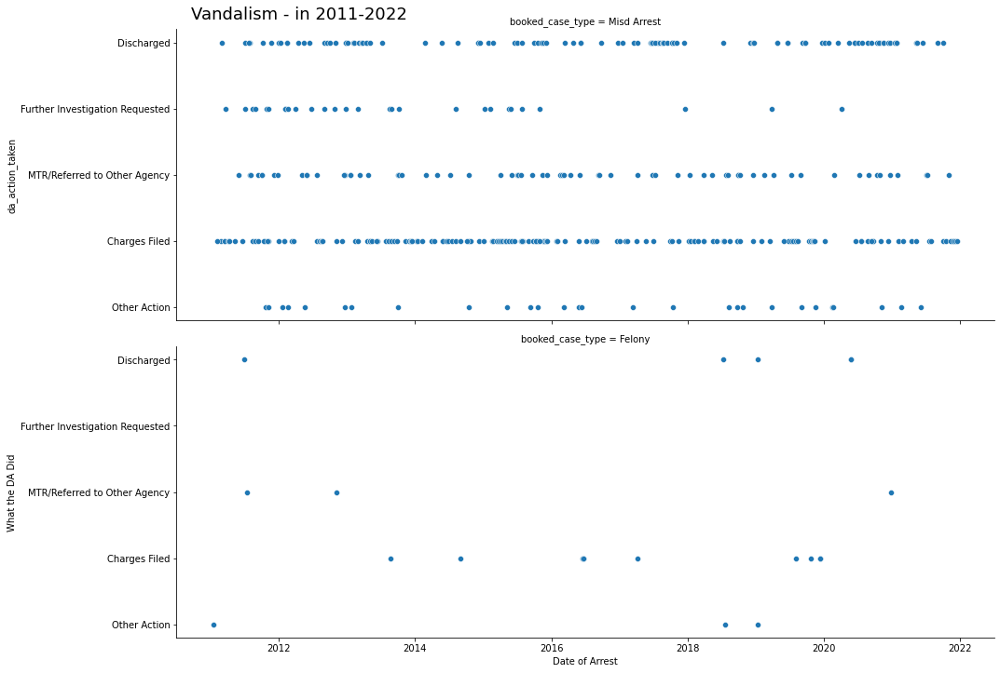

Observations...?  :  


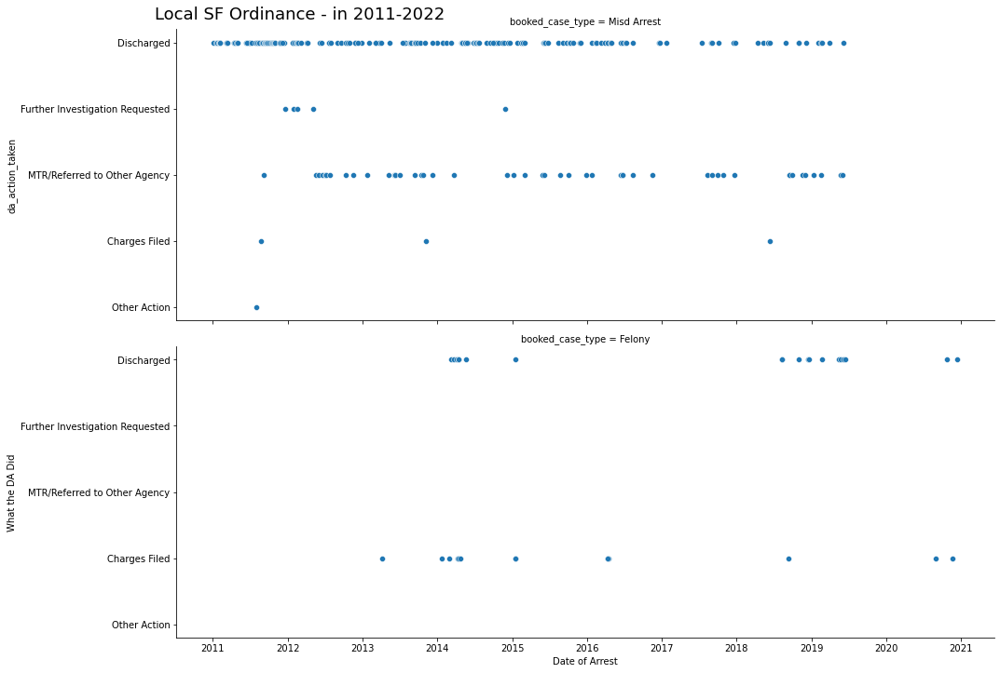

Observations...?  :  


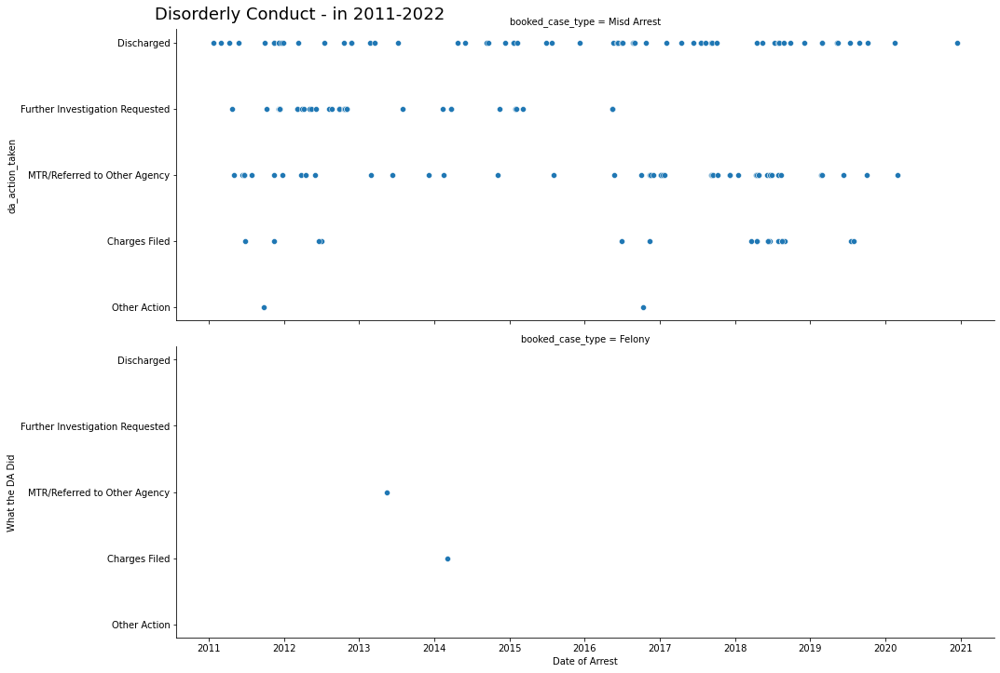

Observations...?  :  


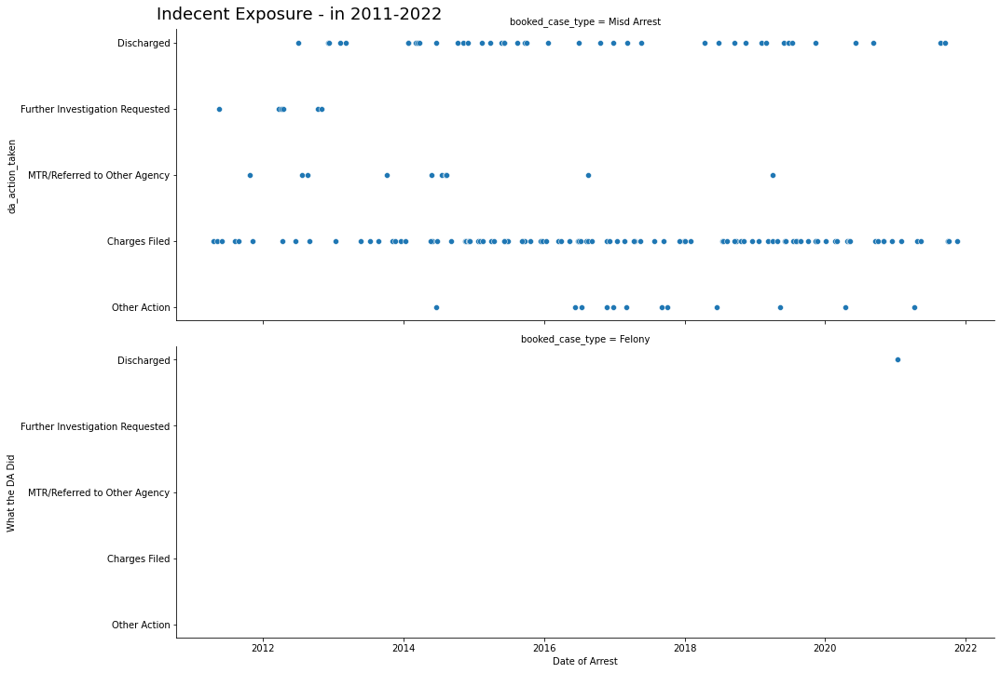

Observations...?  :  


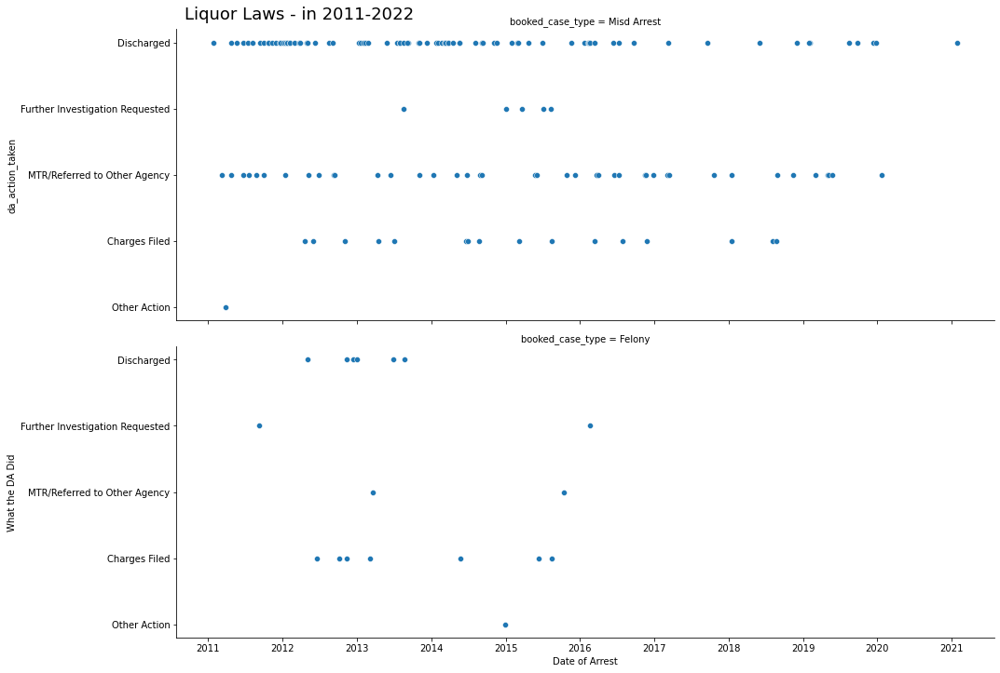

Observations...?  :  


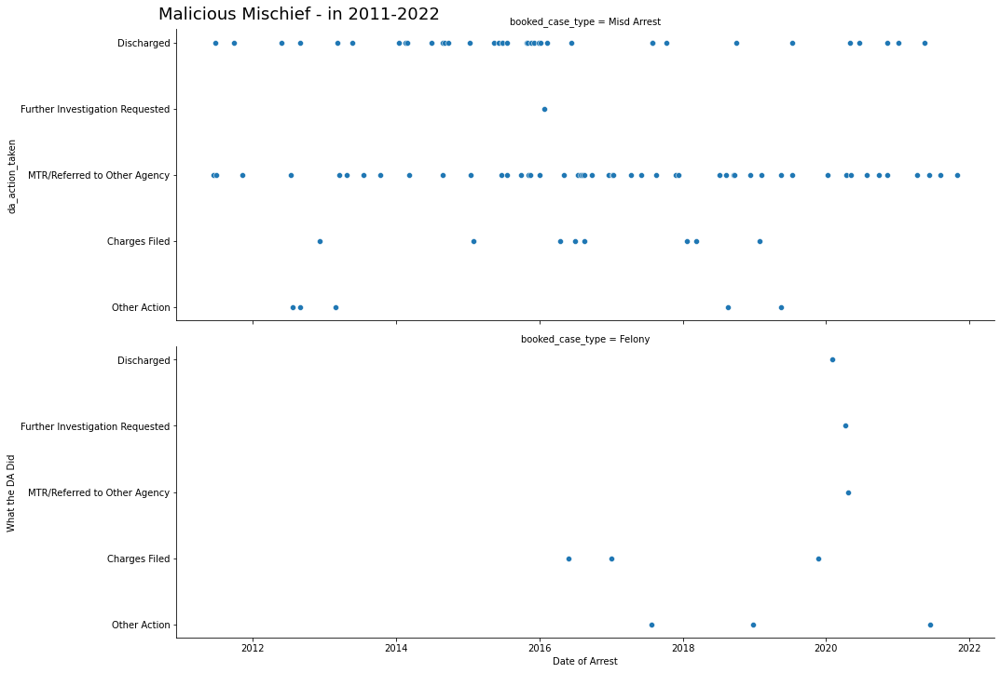

Observations...?  :  


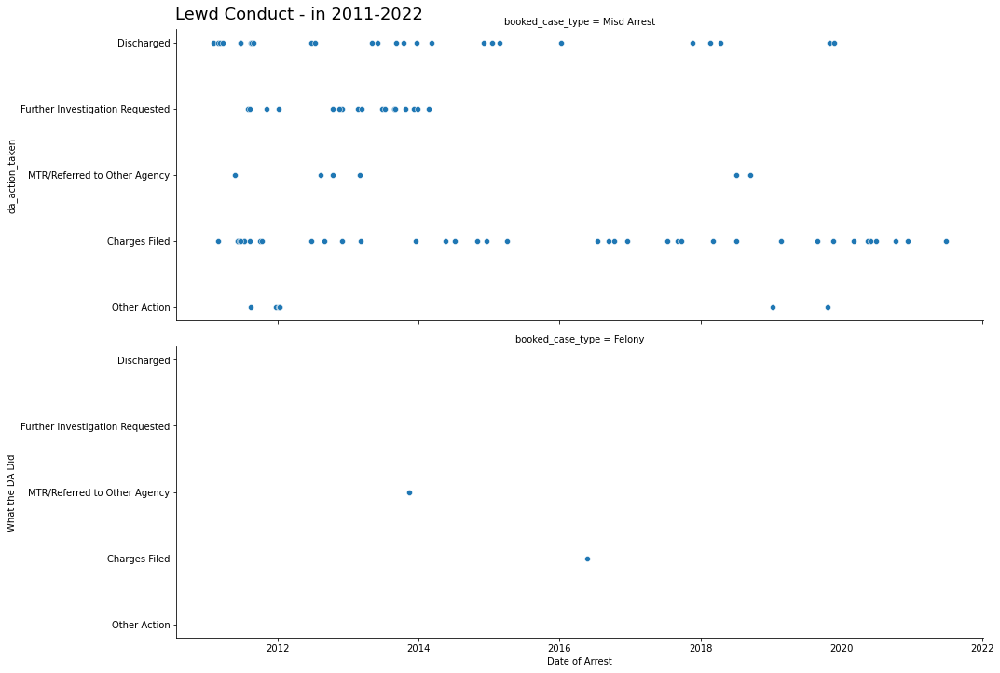

Observations...?  :  


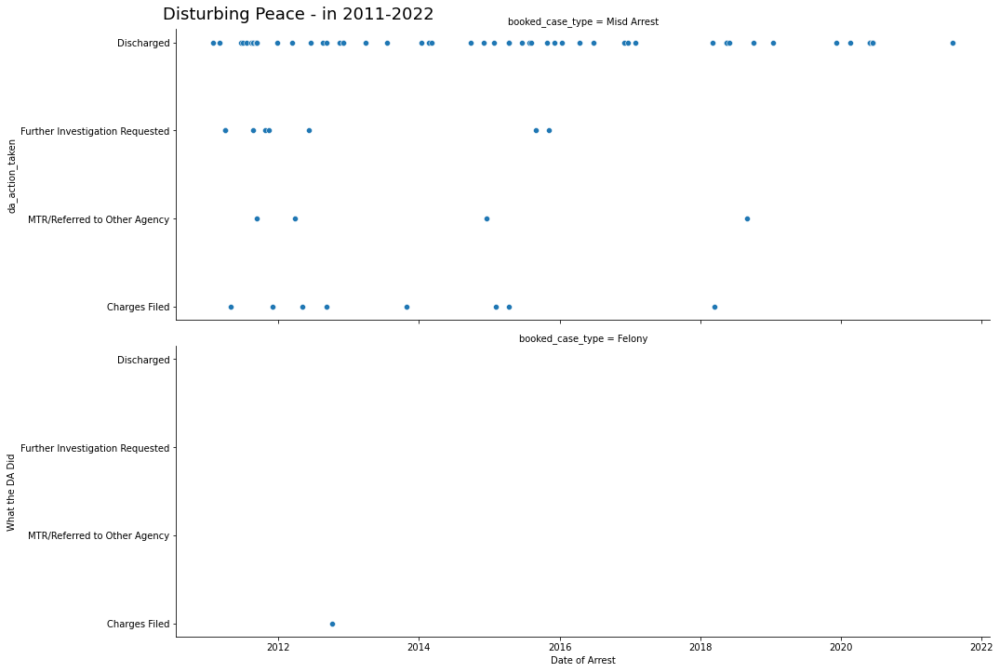

Observations...?  :  


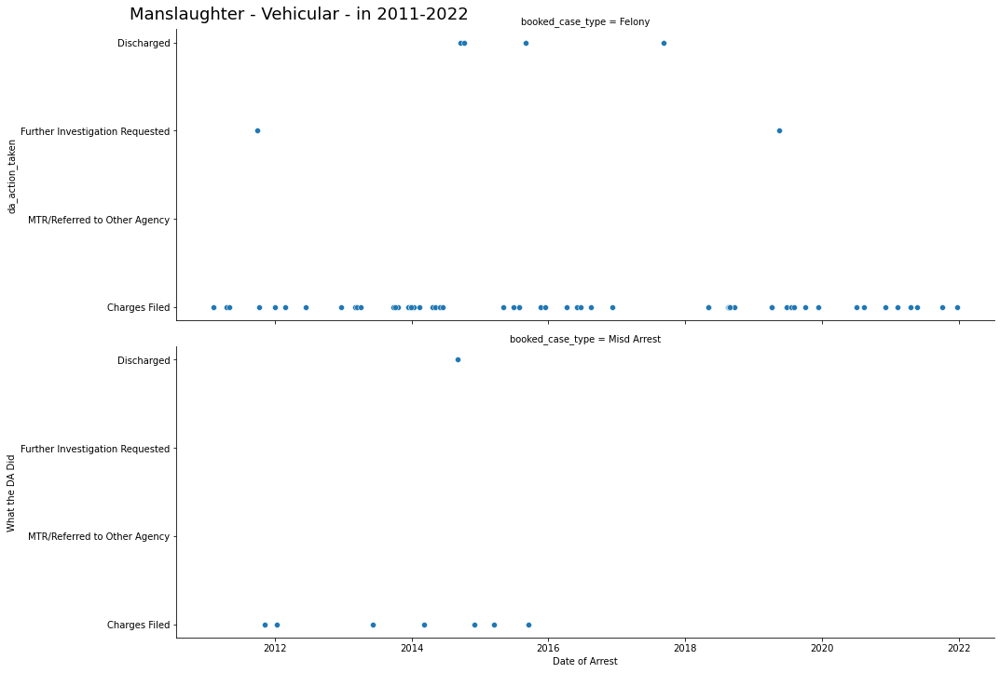

Observations...?  :  


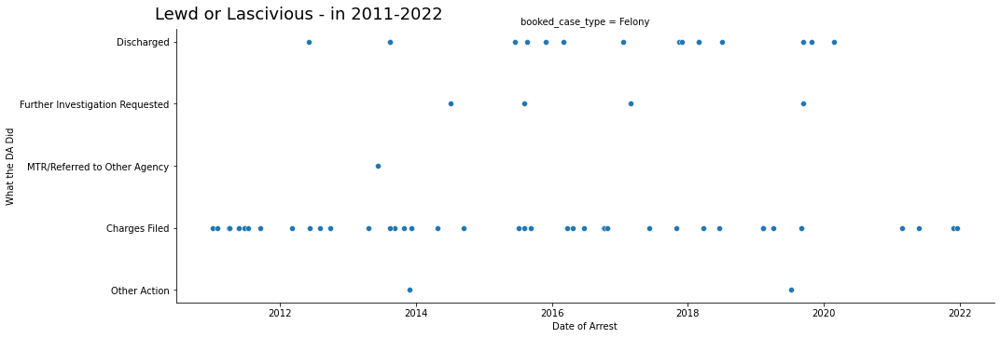

Observations...?  :  


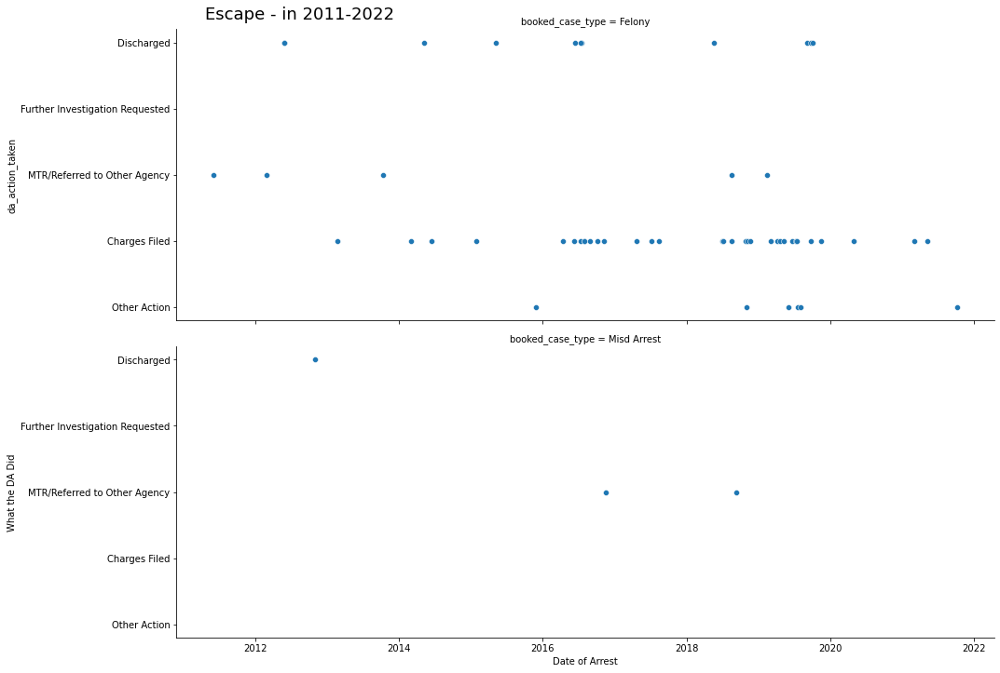

Observations...?  :  


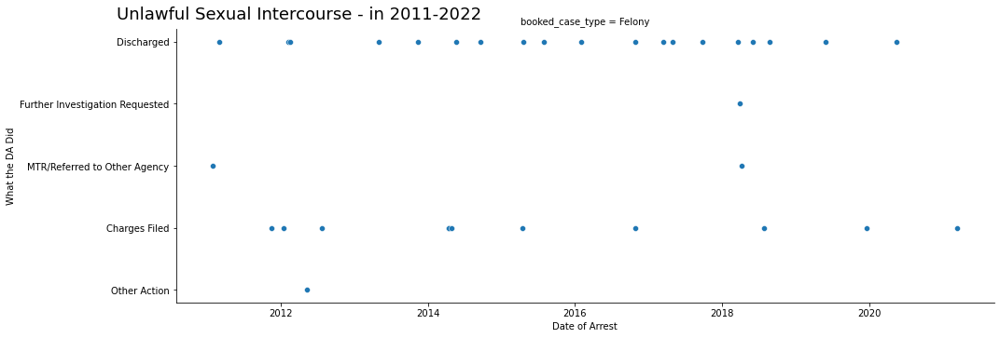

Observations...?  :  


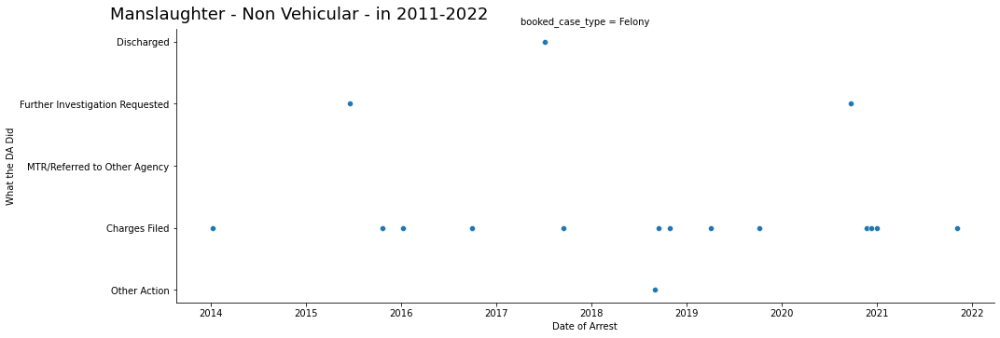

Observations...?  :  


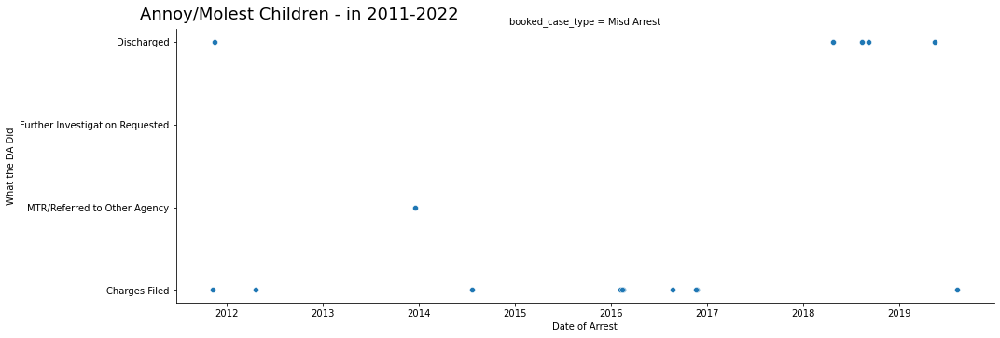

Observations...?  :  


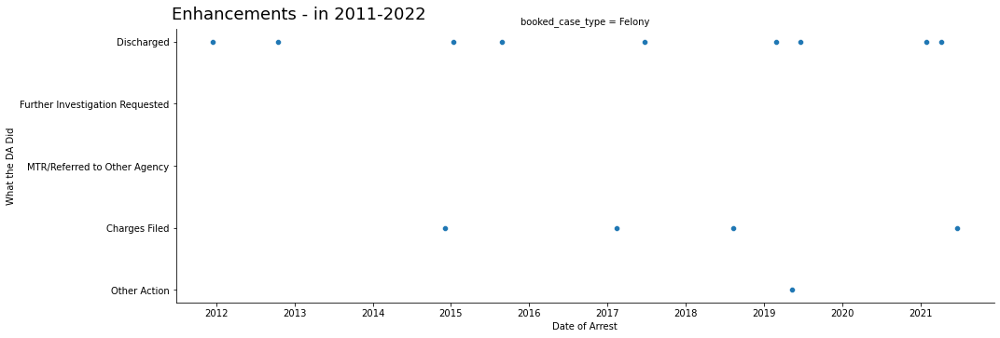

Observations...?  :  


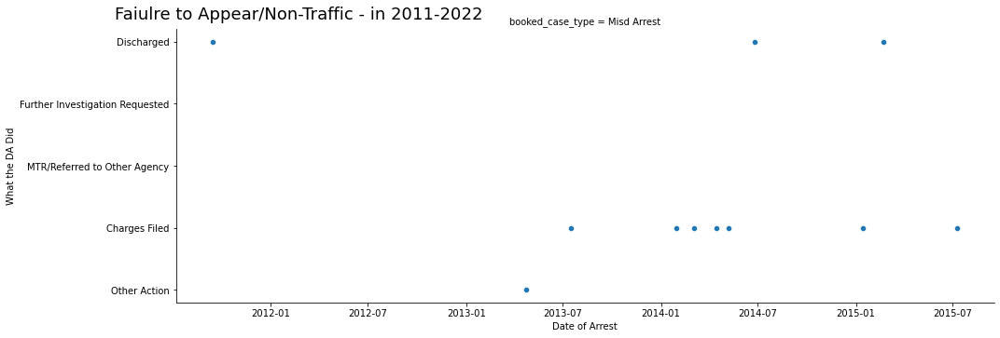

Observations...?  :  


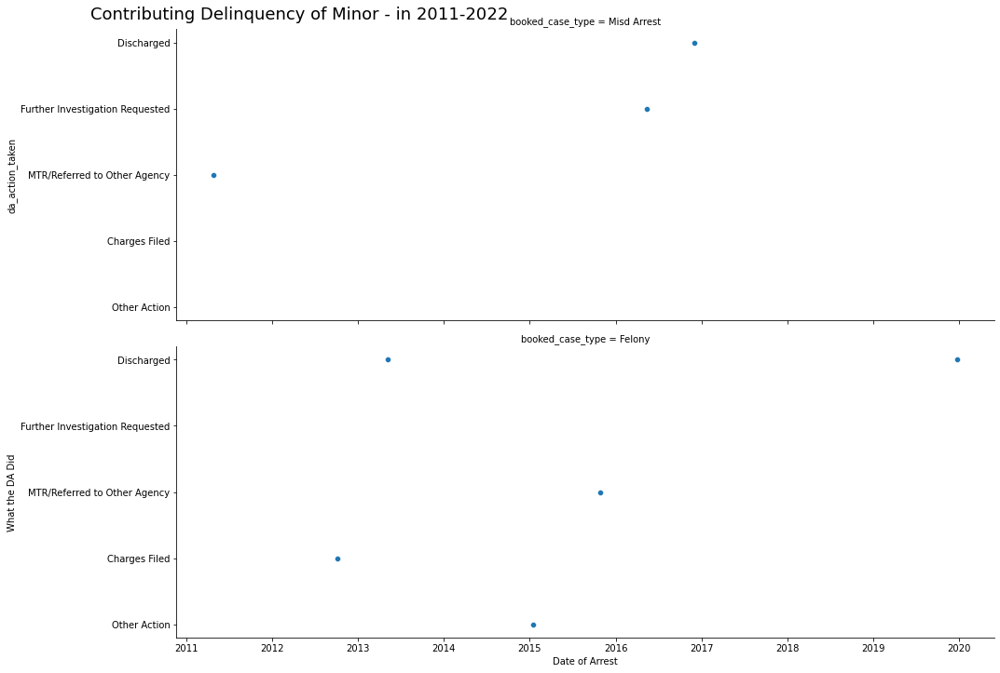

Observations...?  :  


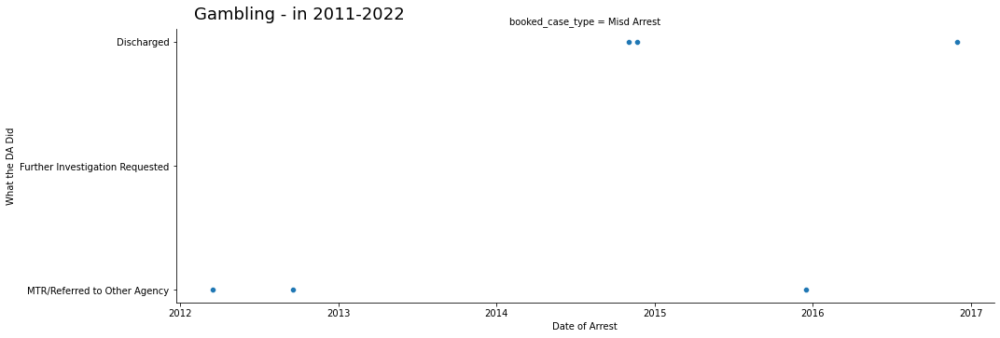

Observations...?  :  


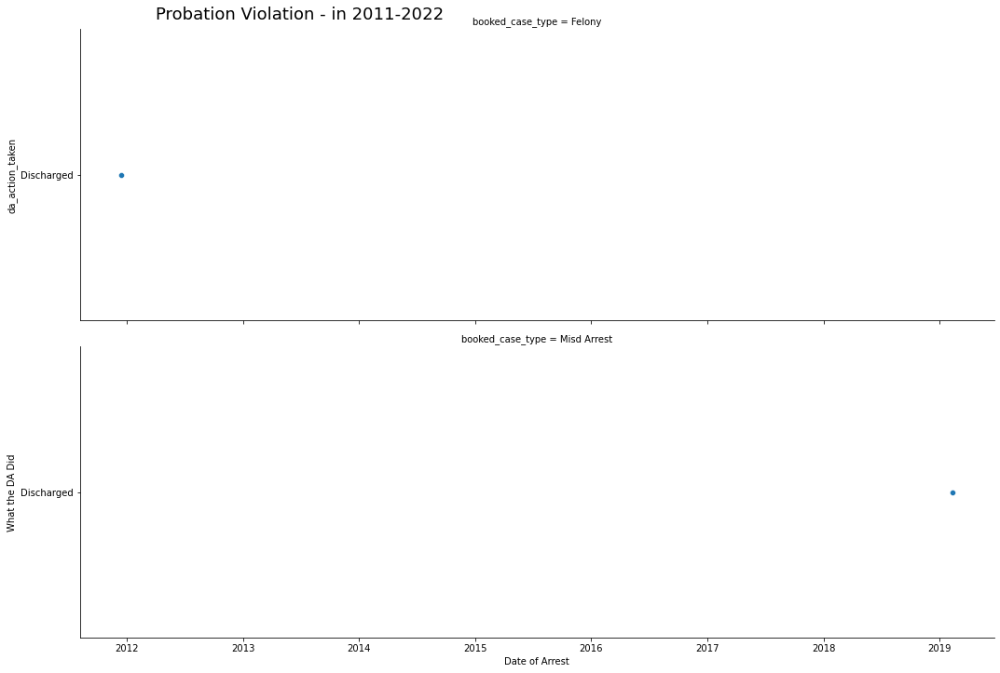

Observations...?  :  


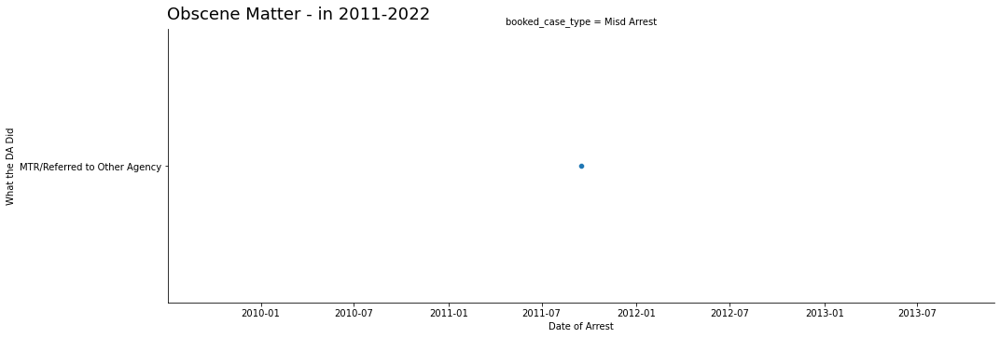

Observations...?  :  


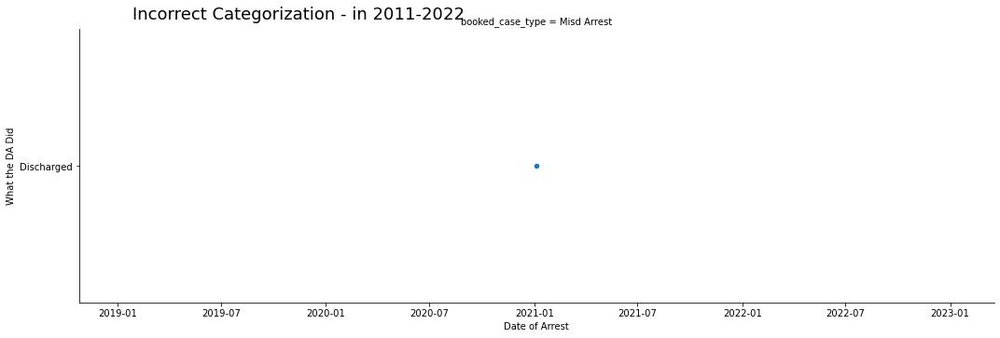

Observations...?  :  


In [68]:
# This is the relplot for a range in dates. 
# Rows show Felony or Misdemeanor.
# And each Crime Type is the suptitle for each pair of plots
# Set the dat_range to the years you want included in the plots

# We will 

for i in df.crime_type.value_counts().index:
    crime = i #'Motor Vehicle Theft'
    date_range = ['2011' , '2022']
    # year = 2012       (df.year == year)],

    sns.relplot(data=df[(df.crime_type == crime) & (df.arrest_date >= date_range[0]) & (df.arrest_date <= date_range[1])],
                x= 'arrest_date',
                y= 'da_action_taken',
                # col= 'year',
                # col_wrap=1,
                row= 'booked_case_type',
                # row= 'da_action_taken',
                height= 5,
                aspect= 3,
                )
    plt.suptitle(f'{crime} - in {date_range[0]}-{date_range[1]}', y=1, x=0.3, fontsize=18)
    
    plt.xlabel('Date of Arrest')
    plt.ylabel('What the DA Did')
    
    plt.show()
    
    print('\n\n\n')
    
    obs = input('Observations...?  : ')
    print('\n\n', obs, '\n\n\n')
    
    crime_type_obs.loc[len(crime_type_obs)] = [i, obs, date_range]

In [69]:
crime_type_obs

,crime_type,observations,dates
0,Assault,"There was only 1 Misdemeanor Assault case, and...","[2011, 2022]"
1,Narcotics,DA stopped requesting further investigation on...,"[2011, 2022]"
2,Other,Other is a mixed basket of what?? I think we m...,"[2011, 2022]"
3,Burglary,Burglary looks like it's discharged more often...,"[2011, 2022]"
4,DUI,Most of the time Misd DUIs are discharged with...,"[2011, 2022]"
5,Assault and Battery,most Ass&Bat charges are Felony with most bein...,"[2011, 2022]"
6,Theft,All but 5 Theft cases are Felony with a simila...,"[2011, 2022]"
7,Robbery,ALL Robbery is Felony in SF and most get disch...,"[2011, 2022]"
8,Weapons,Weapons charges are mostly Felony with a BIG d...,"[2011, 2022]"
9,Motor Vehicle Theft,Stealing cars is always a Felony. And is most ...,"[2011, 2022]"


In [17]:
df.crime_type.value_counts().index

Index(['Assault', 'Narcotics', 'Other', 'Burglary', 'DUI',
       'Assault and Battery', 'Theft', 'Robbery', 'Weapons',
       'Motor Vehicle Theft', 'Petty Theft', 'Trespassing', 'Selected Traffic',
       'Marijauana', 'Other Sex Law Violations', 'Prostitution',
       'Willful Homicide (Att.)', 'Forgery, Checks, Access Cards',
       'Forcible Rape', 'Arson', 'Kidnapping', 'NA (Att.)', 'Willful Homicide',
       'Hit-and-Run', 'Other Theft', 'Vandalism', 'Local SF Ordinance',
       'Disorderly Conduct', 'Indecent Exposure', 'Liquor Laws',
       'Malicious Mischief', 'Lewd Conduct', 'Disturbing Peace',
       'Manslaughter - Vehicular', 'Lewd or Lascivious', 'Escape',
       'Unlawful Sexual Intercourse', 'Manslaughter - Non Vehicular',
       'Annoy/Molest Children', 'Enhancements',
       'Faiulre to Appear/Non-Traffic', 'Contributing Delinquency of Minor',
       'Gambling', 'Probation Violation', 'Obscene Matter',
       'Incorrect Categorization'],
      dtype='object')

In [19]:
df.crime_type.value_counts()

Assault                              25797
Narcotics                            18981
Other                                14000
Burglary                             13300
DUI                                  11824
Assault and Battery                  11152
Theft                                 7375
Robbery                               6892
Weapons                               5559
Motor Vehicle Theft                   5360
Petty Theft                           2041
Trespassing                           1740
Selected Traffic                      1414
Marijauana                            1403
Other Sex Law Violations              1021
Prostitution                           796
Willful Homicide (Att.)                733
Forgery, Checks, Access Cards          624
Forcible Rape                          615
Arson                                  592
Kidnapping                             560
NA (Att.)                              488
Willful Homicide                       456
Hit-and-Run